In [1]:
from jyquickhelper import add_notebook_menu   #pip install jyquickhelper
add_notebook_menu()

## Objectifs

Charger ce dataset.
Utiliser les méthodes usuelles de pandas pour obtenir les informations de base sur ce dataset (nombre d'observations et de variables, types des variables, valeurs manquantes, etc.).
Remplacer la variable 'num' par une variable binaire nommée 'disease' indiquant la survenue ou non d'une maladie cardiaque.
Procéder à une étude exploratoire de ce dataset : étude individuelle des différentes variables, puis étude conjointe avec la variable 'disease'.
Séparer le dataset en un jeu d'entraînement/validation et un jeu de test. On utilisera la fonction train_test_split (Connexions vers un site externe.).
Créer un pipeline (Connexions vers un site externe.) de transformation des variables quantitatives : imputation (Connexions vers un site externe.) puis normalisation (Connexions vers un site externe.).
Créer un pipeline (Connexions vers un site externe.) de transformation des variables qualitatives : imputation (Connexions vers un site externe.) puis One Hot Encoding (Connexions vers un site externe.) ou Ordinal Encoding (Connexions vers un site externe.).
Regrouper les pipelines précédents à l'aide de la fonction Column Transformer (Connexions vers un site externe.).
Heart Disease (1) : Prétraitement des données
On utilisera ici le dataset HeartDiseaseUCI.csv (source : UCI (Connexions vers un site externe.)).

Voici la signification des différentes variables :

âge : âge en années
sexe : sexe (1 = masculin, 0 = féminin)
cp : type de douleur thoracique (Valeur 1 : angine typique, Valeur 2 : angine atypique, Valeur 3 : douleur non angineuse, Valeur 4 : asymptomatique)
trestbps : tension artérielle au repos (en mm Hg à l'admission à l'hôpital)
chol : cholestérol sérique en mg/dl
fbs : (glycémie à jeun > 120 mg/dl) (1 = vrai ; 0 = faux)
restecg : résultats électrocardiographiques au repos (Valeur 0 : normal, Valeur 1 : présentant une anomalie de l'onde ST-T (inversions de l'onde T et/ou élévation ou dépression du segment ST > 0,05 mV), Valeur 2 : montrant une hypertrophie ventriculaire gauche probable ou certaine selon Estes Critères)
thalach : fréquence cardiaque maximale atteinte
exemple : angine de poitrine induite par l'effort (1 = oui, 0 = non)
oldpeak = dépression ST induite par l'exercice par rapport au repos
pente : la pente du segment ST d'exercice maximal (Valeur 1 : montante, Valeur 2 : plate, Valeur 3 : descendante)
ca : nombre de gros vaisseaux (0-3) colorés par fluoroscopie
thal : (Valeur 3 : normal, Valeur 6 = défaut fixe, Valeur 7 = défaut réversible)
num : nombre de vaisseaux principaux (0-4) avec un rétrécissement de diamètre > 50 %

 

## Chargement des librairies (standards et externes)

In [2]:
import pandas as pd  #analyser, nettoyer, visualiser, manipulaler des donnees
import numpy as np   #calcul mathematiques
import seaborn as sns   #visualiser les données
import matplotlib.pyplot as plt  #visualisation
import scipy as scipy   # faire des statistques, algebre, probabilités et optimisation

import warnings  #pour eviter les conseils (avertissements)
warnings.filterwarnings("ignore", category=Warning)

## Data Access

### Rgpd


Quels sont les grands principes des règles de protection des données personnelles ?
Les 5 grands principes des règles de protection des données personnelles sont les suivants :

Le principe de finalité : le responsable d'un fichier ne peut enregistrer et utiliser des informations sur des personnes physiques que dans un but bien précis, légal et légitime ;

Le principe de proportionnalité et de pertinence : les informations enregistrées doivent être pertinentes et strictement nécessaires au regard de la finalité du fichier ;

Le principe d'une durée de conservation limitée : il n'est pas possible de conserver des informations sur des personnes physiques dans un fichier pour une durée indéfinie. Une durée de conservation précise doit être fixée, en fonction du type d'information enregistrée et de la finalité du fichier ;

Le principe de sécurité et de confidentialité : le responsable du fichier doit garantir la sécurité et la confidentialité des informations qu'il détient. Il doit en particulier veiller à ce que seules les personnes autorisées aient accès à ces informations ;

Les droits des personnes 

### Databases: MySQL, PostgreSQL, Oracle, SQL Server, Amazon DynamoDB


### Other:Twitter, Google,  Amazon S3, Azure Blob Store,Sharepoint, Salesforce,Kafka,REST, Web services

In [3]:
fichier="HeartDiseaseUCI.csv"
data = pd.read_csv(fichier)
data.head()


,Unnamed: 0,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,1,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0
1,2,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0,2
2,3,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1
3,4,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0
4,5,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0


### Big data: Hadoop, Acces Hive,Spark & Databricks,HDFS support,Hive, Impala


In [52]:
fichier="HeartDiseaseUCI.csv"
data = pd.read_csv(fichier)



In [4]:
data.head()

,Unnamed: 0,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,1,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0
1,2,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0,2
2,3,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1
3,4,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0
4,5,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0


## Explorer la base de donnees

### Infos generales sur le dataset

### Analyse exploration: Analysez vos données sans effort avec Pandas-profiling


In [54]:
#pip install pandas_profiling

In [5]:
#https://github.com/pandas-profiling/pandas-profiling
#https://www.datacorner.fr/pandas-profiling/
from pandas_profiling import ProfileReport
resultats = data.profile_report(title='Pandas Profiling Report')
resultats.to_file("report_heart.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
from ydata_profiling import ProfileReport

profile = ProfileReport(data, title="Profiling_Report2")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
data.shape  #pas trop d'information!!!

(303, 15)

In [9]:
data.info()  #l'etude conserne 303 personnes et pour chaque individu on dispose 14 informations

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  303 non-null    int64  
 1   age         303 non-null    int64  
 2   sex         303 non-null    int64  
 3   cp          303 non-null    int64  
 4   trestbps    303 non-null    int64  
 5   chol        303 non-null    int64  
 6   fbs         303 non-null    int64  
 7   restecg     303 non-null    int64  
 8   thalach     303 non-null    int64  
 9   exang       303 non-null    int64  
 10  oldpeak     303 non-null    float64
 11  slope       303 non-null    int64  
 12  ca          299 non-null    float64
 13  thal        301 non-null    float64
 14  num         303 non-null    int64  
dtypes: float64(3), int64(12)
memory usage: 35.6 KB


In [19]:
data.query('(num>3 and sex==0)')  #affiche les filles qui sont tres malades

,Unnamed: 0,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
40,41,65,0,4,150,225,0,2,114,0,1.0,2,3.0,7.0,4
121,122,63,0,4,150,407,0,2,154,0,4.0,2,3.0,7.0,4


In [20]:
data.loc[200:205]  #afficher des lignes 200 à 205

,Unnamed: 0,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
200,201,50,0,4,110,254,0,2,159,0,0.0,1,0.0,3.0,0
201,202,64,0,4,180,325,0,0,154,1,0.0,1,0.0,3.0,0
202,203,57,1,3,150,126,1,0,173,0,0.2,1,1.0,7.0,0
203,204,64,0,3,140,313,0,0,133,0,0.2,1,0.0,7.0,0
204,205,43,1,4,110,211,0,0,161,0,0.0,1,0.0,7.0,0
205,206,45,1,4,142,309,0,2,147,1,0.0,2,3.0,7.0,3


### Quantification de données non pertinentes

In [21]:
data.head()

,Unnamed: 0,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,1,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0
1,2,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0,2
2,3,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1
3,4,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0
4,5,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0


In [22]:
data=data.drop(columns="Unnamed: 0")  #cette variable represente les index et donc n apporte aucune information
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0
1,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0,2
2,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1
3,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0
4,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0


### Quantification de données manquantes

In [23]:
data.isna().sum()  #cependant il nous manque 4 infos sur la variable ca et 2 sur thal   (avec sum(is.na(data)))
#Attention, faudra traiter ces donnnees manquantes, aucun modele d'ia ne prend en compte les nan 

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          4
thal        2
num         0
dtype: int64

In [24]:
nb_data=data.shape[1]*data.shape[0]
nb_data

4242

In [65]:
data.isna()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,False,False,False,False,False,False,False,False,False,False,False,False,False,False
299,False,False,False,False,False,False,False,False,False,False,False,False,False,False
300,False,False,False,False,False,False,False,False,False,False,False,False,False,False
301,False,False,False,False,False,False,False,False,False,False,False,False,False,False


<AxesSubplot:>

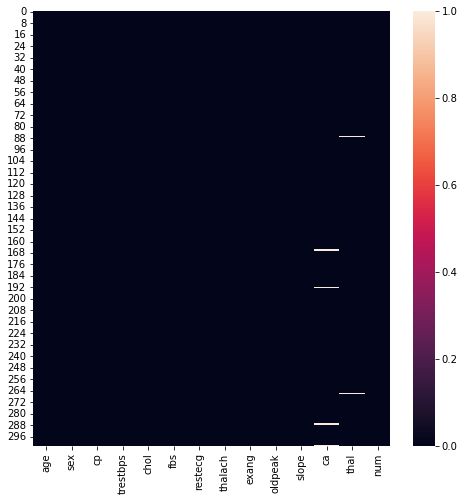

In [28]:
plt.figure(figsize = (8,8))

sns.heatmap(data.isna())

In [67]:
data.isna().sum().sum()/nb_data*100  #On a moins de 1% de donnees manquantes

0.14144271570014144

In [30]:
data.isna().sum().sum()

6

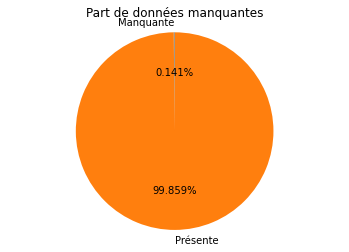

In [68]:
#La fonction graphique_remplissage montre une représentation de la quantité de cellules remplies par variable ainsi que la jauge qui va être appliquées pour la suppression des variables en fonction de leur remplissage
labels = 'Manquante', 'Présente'

fig, ax = plt.subplots()
sizes = data.isnull().sum().sum(), data.notnull().sum().sum()
ax.pie(sizes, labels=labels, autopct='%1.3f%%', shadow=False, startangle=90)
ax.axis('equal')  # s'assurer que le graphe soit un cercle
ax.set_title('Part de données manquantes')

plt.show()

In [26]:
plt.figure(figsize = (8,8))
manquant=data.isna().sum()
manquant

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          4
thal        2
num         0
dtype: int64

<Figure size 576x576 with 0 Axes>

<AxesSubplot:>

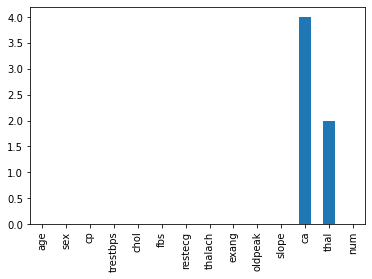

In [27]:
manquant.plot(kind="bar")

In [70]:
data.isna().sum().sum()

6

### Quantification de données dupliquées

In [31]:
data.duplicated()   #avec R duplicated(data)

0      False
1      False
2      False
3      False
4      False
       ...  
298    False
299    False
300    False
301    False
302    False
Length: 303, dtype: bool

In [32]:
data.duplicated().sum() #aucune observation n 'est dupliquée

0

### Quantification de données aberrantes

<AxesSubplot:>

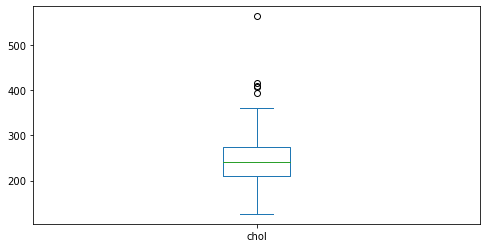

In [37]:
plt.figure(figsize = (8,4))
data.chol.plot(kind="box")    #min, Q1,mediane,Q3, max

In [35]:
#a partir de 350, les taux de cholesterol peuvent etre considérés comme tres grands

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'num'],
      dtype='object')

<AxesSubplot:>

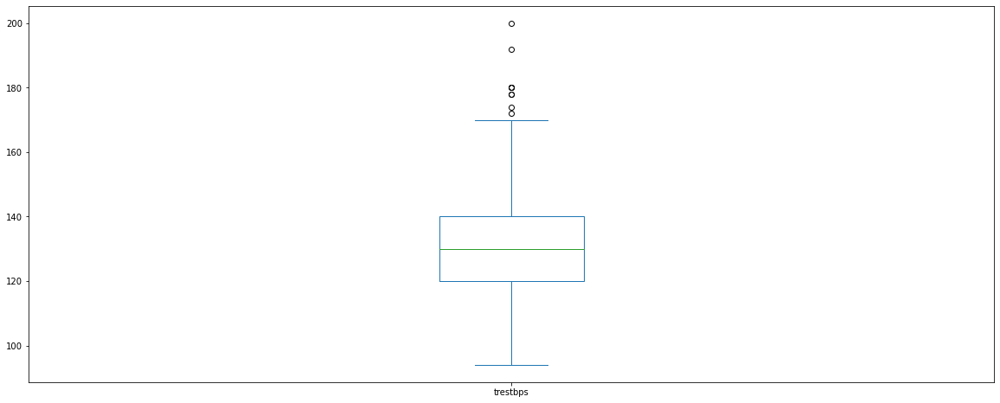

In [38]:
plt.figure(figsize = (20,8))

data.trestbps.plot(kind="box")    #min, Q1,mediane,Q3, max, 
#certaines informations pourraient etre considerées comme valeurs aberrantes ou extemes

In [ ]:
#questions: 
#1. identifier les personnes qui pourraient avoir des anomalies au niveau du chol de cholesterol 
#2. quel est leur age moyen?
##3. identifier les personnes qui pourraient avoir des anomalies au niveau de la pression arterielle au repos
#4. sont elles majoritairement des filles ou garçons?

In [45]:
data.query('chol>350')

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
14,52,1,3,172,199,1,0,162,0,0.5,1,0.0,7.0,0
83,68,1,3,180,274,1,2,150,1,1.6,2,0.0,7.0,3
126,56,0,4,200,288,1,2,133,1,4.0,3,2.0,7.0,3
172,59,0,4,174,249,0,0,143,1,0.0,2,0.0,3.0,1
183,59,1,1,178,270,0,2,145,0,4.2,3,0.0,7.0,0
188,54,1,2,192,283,0,2,195,0,0.0,1,1.0,7.0,1
201,64,0,4,180,325,0,0,154,1,0.0,1,0.0,3.0,0
213,66,0,4,178,228,1,0,165,1,1.0,2,2.0,7.0,3
231,55,0,4,180,327,0,1,117,1,3.4,2,0.0,3.0,2


In [44]:
data.query('chol>350').age.mean()

61.25

In [49]:
data.query('trestbps>170').sex.value_counts()

0    5
1    4
Name: sex, dtype: int64

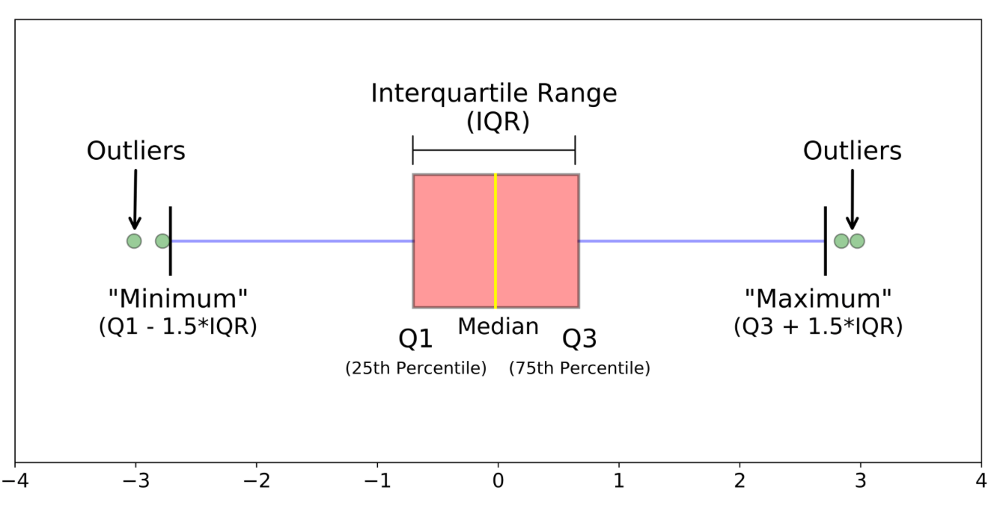

In [52]:

from PIL import Image

image = Image.open(r"C:\Users\sambe\Desktop\IA SCHOOL/image.png")
image

In [53]:
Min=data.min()
Max=data.max()
Q1=data.quantile(0.25)  
Q3=data.quantile(0.75)
IQR=Q3-Q1
outliers_low=(Q1-1.5*IQR)
outliers_high=(Q3+1.5*IQR)
((data<outliers_low) | (data>outliers_high)).sum(axis=0) #condition 1 ou condition 2, 
#ici on a calculé le nombre de donnees aberrantes pour chque colonne
#presence de outliers

age          0
sex          0
cp          23
trestbps     9
chol         5
fbs         45
restecg      0
thalach      1
exang        0
oldpeak      5
slope        0
ca          20
thal         0
num          0
dtype: int64

<AxesSubplot:>

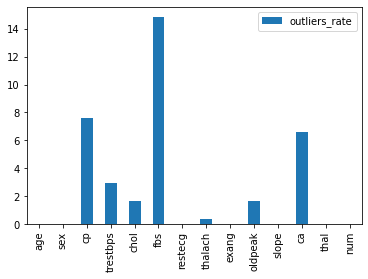

In [56]:
df_num=data.select_dtypes(exclude=['object',"category"])   #object=variables qualitatives
Q1 = df_num.quantile(0.25)  
Q3 = df_num.quantile(0.75)
IQR = Q3 - Q1 
is_outliers = (df_num < (Q1 - 1.5 * IQR)) |(df_num > (Q3 + 1.5 * IQR))
outliers=pd.DataFrame({'outliers_rate':is_outliers.sum(axis=0)/len(df_num)*100})
outliers.plot(kind="bar")  #fin seance1 m1jvds1 le 04 04 2024

In [78]:
outliers_high

age          80.50
sex           2.50
cp            5.50
trestbps    170.00
chol        371.00
fbs           0.00
restecg       5.00
thalach     214.75
exang         2.50
oldpeak       4.00
slope         3.50
ca            2.50
thal         13.00
num           5.00
dtype: float64

In [79]:
outliers_low

age          28.50
sex          -1.50
cp            1.50
trestbps     90.00
chol        115.00
fbs           0.00
restecg      -3.00
thalach      84.75
exang        -1.50
oldpeak      -2.40
slope        -0.50
ca           -1.50
thal         -3.00
num          -3.00
dtype: float64

In [80]:
((data<outliers_low) | (data>outliers_high)) #condition 1 ou condition 2

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,False,False,True,False,False,True,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,True,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,False,False,True,False,False,False,False,False,False,False,False,False,False,False
299,False,False,False,False,False,True,False,False,False,False,False,False,False,False
300,False,False,False,False,False,False,False,False,False,False,False,False,False,False
301,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [81]:
((data<outliers_low) | (data>outliers_high)).sum(axis=0) #condition 1 ou condition 2, 
#ici on a calculé le nombre de donnees aberrantes pour chque colonne
#presence de outliers, attention pour votre future modele d'IA

age          0
sex          0
cp          23
trestbps     9
chol         5
fbs         45
restecg      0
thalach      1
exang        0
oldpeak      5
slope        0
ca          20
thal         0
num          0
dtype: int64

In [82]:
((data<outliers_low) | (data>outliers_high)).sum(axis=1) #condition 1 ou condition 2, 
#ici on a calculé le nombre de donnees aberrantes pour chque LIGNE

0      2
1      1
2      0
3      0
4      0
      ..
298    1
299    1
300    0
301    0
302    0
Length: 303, dtype: int64

<AxesSubplot:>

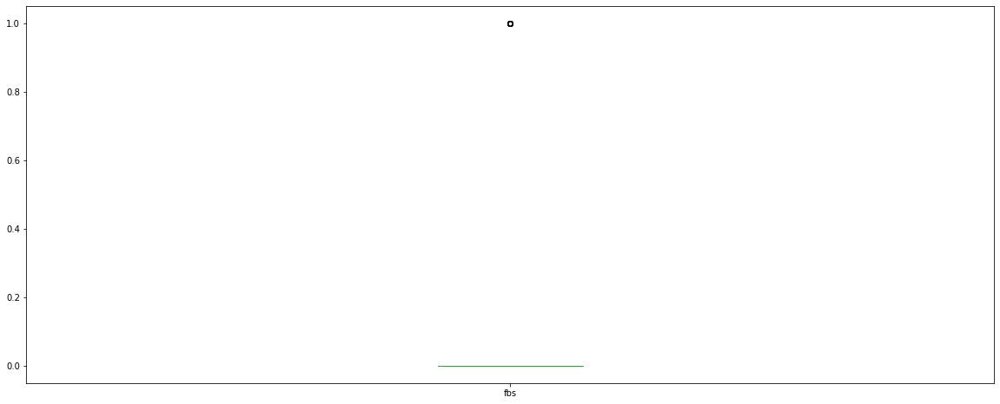

In [83]:
plt.figure(figsize = (20,8))

data.fbs.plot(kind="box")    # on a voulu regardé ce qui se passe avec cette variable

In [84]:
((data<outliers_low) | (data>outliers_high)).sum(axis=0).sum()/nb_data*100   #On a 2.5% des valeurs qui sont aberrantes

2.545968882602546

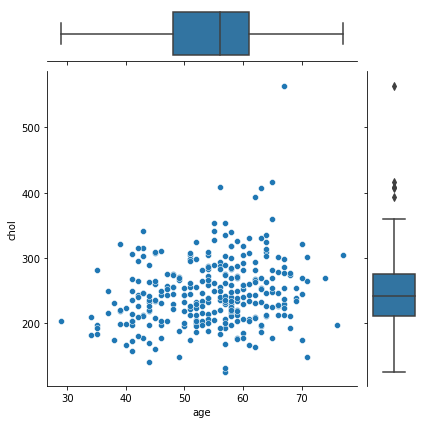

In [85]:

g = sns.JointGrid(data=data, x="age", y="chol")#, hue="num")
g.plot(sns.scatterplot, sns.boxplot) #sns.kdeplot histplot
#g.refline(x=33, y=370)
#g.refline(x=75, y=120)

### Statistiques generales

In [86]:
data.describe() #o remarque que les donnees n'ont pas les memes echelles (pour le modele d IA il faudra normaliser!!)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,299.000000,301.000000,303.000000
mean,54.438944,0.679868,3.158416,131.689769,246.693069,0.148515,0.990099,149.607261,0.326733,1.039604,1.600660,0.672241,4.734219,0.937294
std,9.038662,0.467299,0.960126,17.599748,51.776918,0.356198,0.994971,22.875003,0.469794,1.161075,0.616226,0.937438,1.939706,1.228536
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
25%,48.000000,0.000000,3.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
50%,56.000000,1.000000,3.000000,130.000000,241.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,0.000000,3.000000,0.000000
75%,61.000000,1.000000,4.000000,140.000000,275.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,1.000000,7.000000,2.000000
max,77.000000,1.000000,4.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,3.000000,7.000000,4.000000


In [87]:
taux_de_dispersion=(data.std()/data.mean()*100).sort_values()
taux_de_dispersion  #>50% dispersée sinon homogene

trestbps     13.364552
thalach      15.290036
age          16.603302
chol         20.988396
cp           30.398961
slope        38.498252
thal         40.972031
sex          68.733760
restecg     100.492100
oldpeak     111.684359
num         131.072646
ca          139.449780
exang       143.785579
fbs         239.839902
dtype: float64

conclusion: 0%     duppliquées
            0.15%  manquantes
            2.5%   extremes
            0% non pertinentes
            les donnees ne sont pas aux memes echelles
            on a peut d information (4242 infos)
            on a 50% de nos variables qui sont dispersées, voir tres dispersées (exemple fbs)
            cette maladie (desease) depend beaucoup des variables thal de l'ordre de 27%, ca(21%), exang(18%) etc  


### Remplacer ou renommer une variable 

In [88]:
data.num

0      0
1      2
2      1
3      0
4      0
      ..
298    1
299    2
300    3
301    1
302    0
Name: num, Length: 303, dtype: int64

In [89]:
data.num.value_counts(normalize=True)*100
#54% de personnes saines et 4% de personnes gravement atteintes
#attention: les donnees sont ici desequilibrées: unbalenced data (technique smote: https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/)
#num est une variable qualitative ORDINALE

0    54.125413
1    18.151815
2    11.881188
3    11.551155
4     4.290429
Name: num, dtype: float64

<AxesSubplot:ylabel='num'>

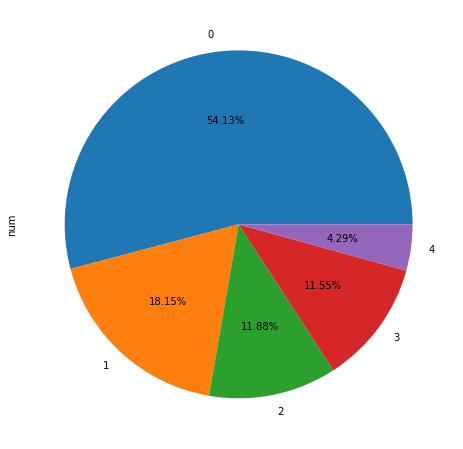

In [90]:
plt.figure(figsize = (20,8))

data.num.value_counts().plot(kind="pie", autopct='%1.2f%%')

In [91]:
data.num=data.num.apply(lambda x:1 if x>=1 else 0)

<AxesSubplot:ylabel='num'>

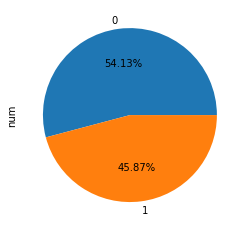

In [92]:
data.num.value_counts().plot(kind="pie", autopct='%1.2f%%')

In [93]:
data.rename(columns={"num":"desease"}, inplace=True)
data.rename(columns={"sex":"genre"}, inplace=True)

data.head()

,age,genre,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease
0,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0
1,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0,1
2,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1
3,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0
4,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0


In [94]:
data

,age,genre,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease
0,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0
1,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0,1
2,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1
3,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0
4,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45,1,1,110,264,0,0,132,0,1.2,2,0.0,7.0,1
299,68,1,4,144,193,1,0,141,0,3.4,2,2.0,7.0,1
300,57,1,4,130,131,0,0,115,1,1.2,2,1.0,7.0,1
301,57,0,2,130,236,0,2,174,0,0.0,2,1.0,3.0,1


0    54.125413
1    45.874587
Name: desease, dtype: float64


<AxesSubplot:ylabel='desease'>

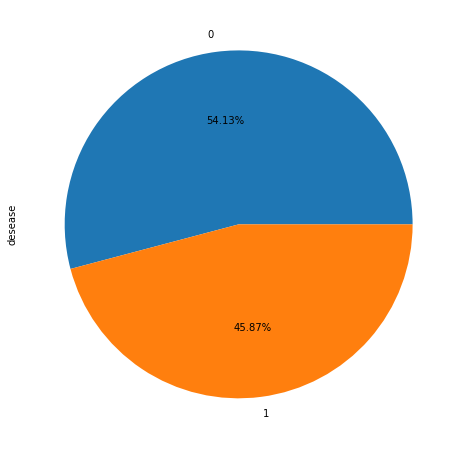

In [95]:
print(data.desease.value_counts(normalize=True)*100)
plt.figure(figsize = (20,8))

data.desease.value_counts().plot(kind="pie", autopct='%1.2f%%')  #cette variable est plus equilibrée et on pourra  creer un bon modele

In [96]:
data.head()

,age,genre,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease
0,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0
1,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0,1
2,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1
3,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0
4,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0


Dans cette exploration, notre variable target sera () ou variables à expliquer ou taget: desease
et les autres seront nos variables explicatives ou features (age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal)

questions: quelles sont les variables importantes pour pouvoir predire "desease"

In [99]:
data.corr(method="pearson")["desease"].sort_values()
#cette maladie depend beaucoup des variables thal, ca, etc  (attention: ici les correlations sont lineaires)

thalach    -0.417167
fbs         0.025264
chol        0.085164
trestbps    0.150825
restecg     0.169202
age         0.223120
genre       0.276816
slope       0.339213
cp          0.414446
oldpeak     0.424510
exang       0.431894
ca          0.460442
thal        0.525689
desease     1.000000
Name: desease, dtype: float64

In [101]:
data.corr(method="spearman")["desease"].sort_values()*100
#cette maladie depend beaucoup des variables thal, ca, etc  (attention: ici les correlations sont NON lineaires)

thalach     -42.346729
fbs           2.526367
chol         12.112216
trestbps     12.816604
restecg      16.927747
age          23.667448
genre        27.681632
slope        36.442540
oldpeak      41.338151
exang        43.189399
cp           47.200636
ca           48.860247
thal         52.220227
desease     100.000000
Name: desease, dtype: float64

In [49]:
data.corr(method="pearson")["desease"].sort_values()**2
#cette maladie depend beaucoup des variables thal, ca, etc  (attention: ici les correlations sont lineaires)

thalach     0.174028
fbs         0.000638
chol        0.007253
trestbps    0.022748
restecg     0.028629
age         0.049783
sex         0.076627
slope       0.115066
cp          0.171766
oldpeak     0.180209
exang       0.186532
ca          0.212007
thal        0.276349
desease     1.000000
Name: desease, dtype: float64

### Etude univariée de variable qualitative

In [50]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        299 non-null    float64
 12  thal      301 non-null    float64
 13  desease   303 non-null    int64  
dtypes: float64(3), int64(11)
memory usage: 33.3 KB


In [51]:
data.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,299.000000,301.000000,303.000000
mean,54.438944,0.679868,3.158416,131.689769,246.693069,0.148515,0.990099,149.607261,0.326733,1.039604,1.600660,0.672241,4.734219,0.458746
std,9.038662,0.467299,0.960126,17.599748,51.776918,0.356198,0.994971,22.875003,0.469794,1.161075,0.616226,0.937438,1.939706,0.499120
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
25%,48.000000,0.000000,3.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
50%,56.000000,1.000000,3.000000,130.000000,241.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,0.000000,3.000000,0.000000
75%,61.000000,1.000000,4.000000,140.000000,275.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,1.000000,7.000000,1.000000
max,77.000000,1.000000,4.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,3.000000,7.000000,1.000000


In [52]:
data.sex.value_counts()  #"on compte chaque valeurs "

1    206
0     97
Name: sex, dtype: int64

In [53]:
data.sex.value_counts(normalize=True)*100 #"on compte chaque valeurs "   

1    67.986799
0    32.013201
Name: sex, dtype: float64

<AxesSubplot:ylabel='sex'>

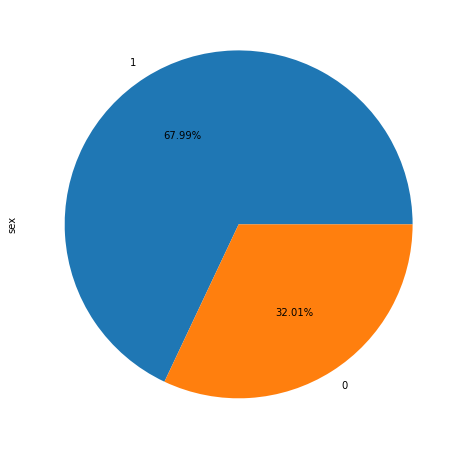

In [54]:
plt.figure(figsize = (20,8))

data.sex.value_counts().plot(kind="pie", autopct='%1.2f%%')


In [103]:
import scipy

#test avec pearson:
#HO: les deux variables sont independantes
scipy.stats.pearsonr(data.age, data.chol)  #pvalue<5% donc y'a

(0.20895026994678262, 0.0002496169246358765)

<AxesSubplot:ylabel='desease'>

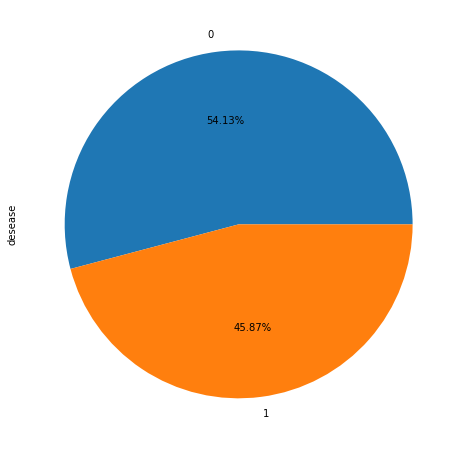

In [55]:
plt.figure(figsize = (20,8))

data.desease.value_counts().plot(kind="pie", autopct='%1.2f%%')


In [57]:
data.corr()["desease"].sort_values(ascending=False)  #detecte les correlation LINEAIRE

desease     1.000000
thal        0.525689
ca          0.460442
exang       0.431894
oldpeak     0.424510
cp          0.414446
slope       0.339213
sex         0.276816
age         0.223120
restecg     0.169202
trestbps    0.150825
chol        0.085164
fbs         0.025264
thalach    -0.417167
Name: desease, dtype: float64

In [58]:
df_num=data.select_dtypes(exclude=['object',"category"])   #object=variables qualitatives
Q1 = df_num.quantile(0.25)  
Q3 = df_num.quantile(0.75)
IQR = Q3 - Q1 
is_outliers = (df_num < (Q1 - 1.5 * IQR)) |(df_num > (Q3 + 1.5 * IQR))
outliers=pd.DataFrame({'outliers_rate':is_outliers.sum(axis=0)/len(df_num)*100})
outliers

,outliers_rate
age,0.000000
sex,0.000000
cp,7.590759
trestbps,2.970297
chol,1.650165
fbs,14.851485
restecg,0.000000
thalach,0.330033
exang,0.000000
oldpeak,1.650165


In [59]:
data.corr()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease
age,1.000000,-0.097542,0.104139,0.284946,0.208950,0.118530,0.148868,-0.393806,0.091661,0.203805,0.161770,0.362605,0.127389,0.223120
sex,-0.097542,1.000000,0.010084,-0.064456,-0.199915,0.047862,0.021647,-0.048663,0.146201,0.102173,0.037533,0.093185,0.380936,0.276816
cp,0.104139,0.010084,1.000000,-0.036077,0.072319,-0.039975,0.067505,-0.334422,0.384060,0.202277,0.152050,0.233214,0.265246,0.414446
trestbps,0.284946,-0.064456,-0.036077,1.000000,0.130120,0.175340,0.146560,-0.045351,0.064762,0.189171,0.117382,0.098773,0.133554,0.150825
chol,0.208950,-0.199915,0.072319,0.130120,1.000000,0.009841,0.171043,-0.003432,0.061310,0.046564,-0.004062,0.119000,0.014214,0.085164
fbs,0.118530,0.047862,-0.039975,0.175340,0.009841,1.000000,0.069564,-0.007854,0.025665,0.005747,0.059894,0.145478,0.071358,0.025264
restecg,0.148868,0.021647,0.067505,0.146560,0.171043,0.069564,1.000000,-0.083389,0.084867,0.114133,0.133946,0.128343,0.024531,0.169202
thalach,-0.393806,-0.048663,-0.334422,-0.045351,-0.003432,-0.007854,-0.083389,1.000000,-0.378103,-0.343085,-0.385601,-0.264246,-0.279631,-0.417167
exang,0.091661,0.146201,0.384060,0.064762,0.061310,0.025665,0.084867,-0.378103,1.000000,0.288223,0.257748,0.145570,0.329680,0.431894
oldpeak,0.203805,0.102173,0.202277,0.189171,0.046564,0.005747,0.114133,-0.343085,0.288223,1.000000,0.577537,0.295832,0.341004,0.424510


<AxesSubplot:>

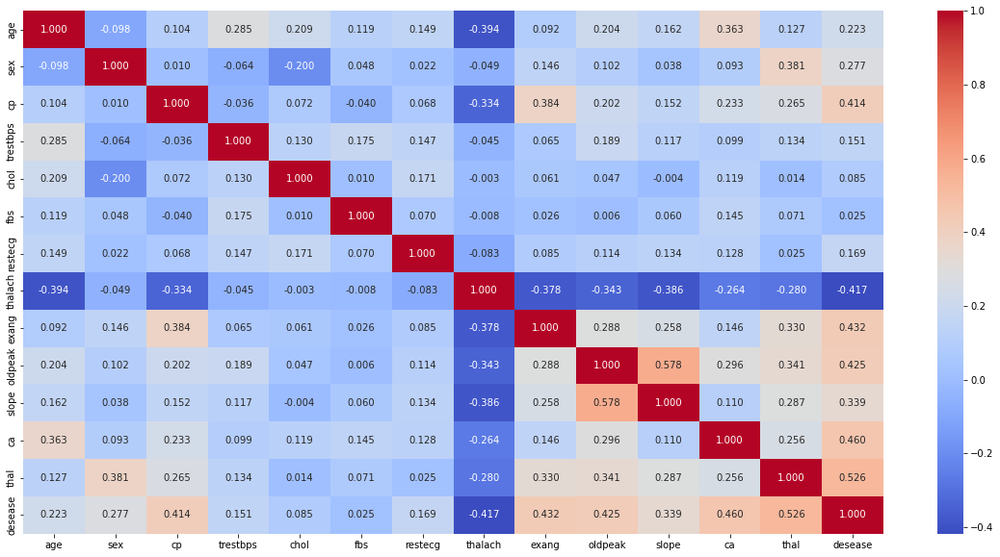

In [60]:
f, ax = plt.subplots(figsize=(20, 10))    #1 correspond à 2.54cm

sns.heatmap(data.corr(),annot=True,fmt="1.3f",cmap='coolwarm')

<AxesSubplot:>

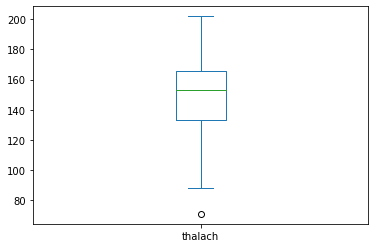

In [107]:
data.thalach.plot(kind="box")

On voit que les deux variables les plus correlées (lineairement) dans ce dataset sont oldpeak et ca.
Cela veut dire que la connaissance de la dépression ST induite par l'exercice par rapport au repos est tres importante pour pouvoir predire le nombre de gros vaisseaux (0-3) colorés par fluoroscopie

Le facteur d'inflation de la variance est une mesure de l'augmentation de la variance des estimations des paramètres si une variable supplémentaire, donnée par exog_idx, est ajoutée à la régression linéaire. C'est une mesure de la multicolinéarité de la matrice de conception, exog.

Une recommandation est que si VIF est supérieur à 5, alors la variable explicative donnée par exog_idx est fortement colinéaire avec les autres variables explicatives, et les estimations des paramètres auront de grandes erreurs standard à cause de cela.

In [109]:
#bonus
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(data.dropna().values, i) for i in range(data.shape[1])]
vif["features"] = data.columns
vif.sort_values(by="VIF Factor")

,VIF Factor,features
5,1.259747,fbs
8,2.086557,exang
6,2.188922,restecg
11,2.285916,ca
9,3.191434,oldpeak
1,3.923610,genre
13,3.964384,desease
12,11.425012,thal
10,11.765073,slope
2,14.027296,cp


Comme nous pouvons le voir, la taille et le poids ont des valeurs très élevées de VIF, indiquant que ces deux variables sont fortement corrélées. Ceci est attendu car la taille d'une personne influence son poids. Par conséquent, considérer ces deux caractéristiques ensemble conduit à un modèle à forte multicolinéarité.

### Etude univariée de variable quantitative

In [62]:
#Parametres de tendance: mean, min , max, 
#Paramtres de position: mediane, Q1,Q3, deciles, centiles
#parametres de dispersion: var, ecart type, ecart interquatiles
#parametres de forme: coeff d applatissement (kurtosis) et d assymetrie (skew)
#parametres de concentration: indice de geni, courbe de lorenz


#### Les paramètres de tendance centrale et dispersion.


In [63]:
data.describe() #à interpreter!

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,299.000000,301.000000,303.000000
mean,54.438944,0.679868,3.158416,131.689769,246.693069,0.148515,0.990099,149.607261,0.326733,1.039604,1.600660,0.672241,4.734219,0.458746
std,9.038662,0.467299,0.960126,17.599748,51.776918,0.356198,0.994971,22.875003,0.469794,1.161075,0.616226,0.937438,1.939706,0.499120
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
25%,48.000000,0.000000,3.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
50%,56.000000,1.000000,3.000000,130.000000,241.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,0.000000,3.000000,0.000000
75%,61.000000,1.000000,4.000000,140.000000,275.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,1.000000,7.000000,1.000000
max,77.000000,1.000000,4.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,3.000000,7.000000,1.000000


In [64]:
data.sem()  #standart error of mean ou bien erreur type

age         0.519258
sex         0.026846
cp          0.055158
trestbps    1.011079
chol        2.974506
fbs         0.020463
restecg     0.057160
thalach     1.314135
exang       0.026989
oldpeak     0.066702
slope       0.035401
ca          0.054213
thal        0.111803
desease     0.028674
dtype: float64

#### Les parametres de concentration: lorenz et indice de gini

<AxesSubplot:xlabel='age', ylabel='Count'>

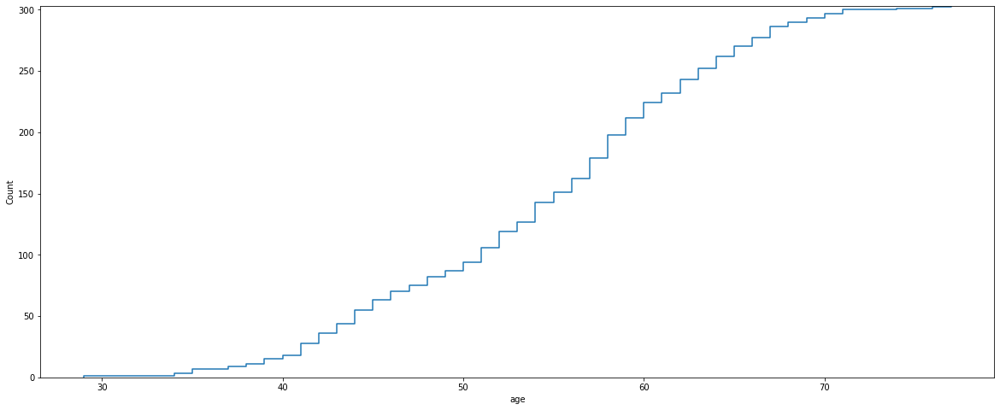

In [65]:
plt.figure(figsize = (20,8))
sns.ecdfplot(data=data, x="age", stat="count")

<AxesSubplot:xlabel='age', ylabel='Proportion'>

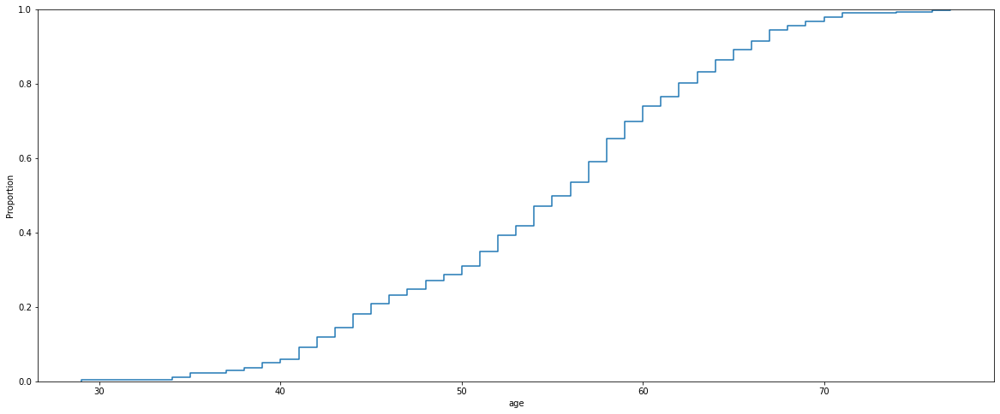

In [66]:
plt.figure(figsize = (20,8))

sns.ecdfplot(data=data, x="age", complementary=False)

#### Les parametres de forme: skewness et kurtosis

In [67]:
(data.skew()-0).sort_values()   #le coefficient d'asymetrique (pour la loi normale skew=0)

cp         -0.841754
sex        -0.774935
thalach    -0.537449
age        -0.209060
restecg     0.019900
desease     0.166406
thal        0.244447
slope       0.508316
trestbps    0.706035
exang       0.742532
chol        1.135503
ca          1.189352
oldpeak     1.269720
fbs         1.986652
dtype: float64

In [68]:
note=pd.DataFrame([20,1,20,8,9,9,19,14,15,17,18,10,12,0,6,17])

print(note.mean())  #la moyenne est de 12/20
print(note.median()) # la moitié de la classe a plus de 13/20
print(note.std()/note.mean()*100) # la classe est dispersée (taux de dispersion est superieur à 50%)
print(note.skew())   #cela veut dire que la plupart des eleves sont au dessus de la moyenne de classe
print(note.kurtosis()) # il y'a pas eu trop de notes extremes (d'ailleurs y'a n'en pas d 'apres le calcul des outliers')
#conclusion generale: la moyenne de classe est de 12 avec un controle relativement faisable (skew) 
#avec peu de note exterme(kurtosis), cependant votre classe est dispersée

0    12.1875
dtype: float64
0    13.0
dtype: float64
0    52.514423
dtype: float64
0   -0.54599
dtype: float64
0   -0.6435
dtype: float64


<AxesSubplot:ylabel='Density'>

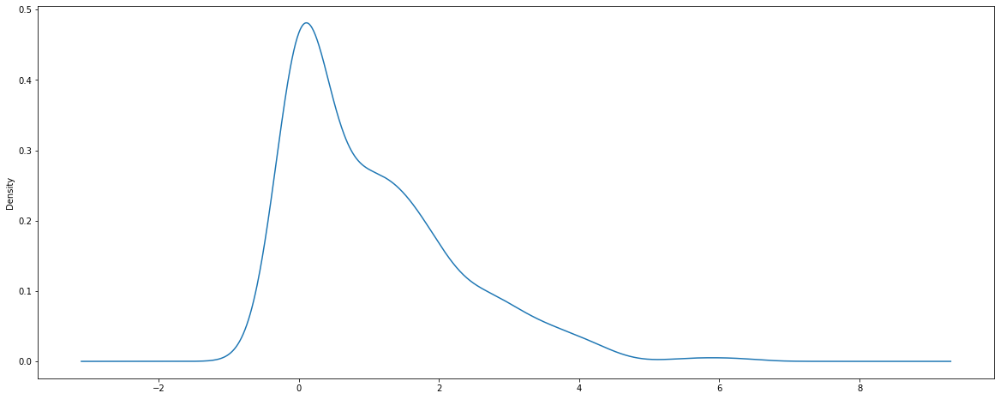

In [69]:
plt.figure(figsize = (20,8))

data.oldpeak.plot(kind="density")   #cette variable est tres decalée vers la droite   (mean>mediane)



In [70]:
data.kurtosis()-3

age        -3.523383
sex        -4.408819
cp         -3.400655
trestbps   -2.119926
chol        1.491724
fbs        -1.040322
restecg    -4.999331
thalach    -3.053541
exang      -4.458317
oldpeak    -1.424187
slope      -3.627521
ca         -2.740744
thal       -4.917674
desease    -4.985458
dtype: float64

### Visualisation: box-hist-density-pie-violon-barplot-scatter-etc

In [71]:
data.shape

(303, 14)

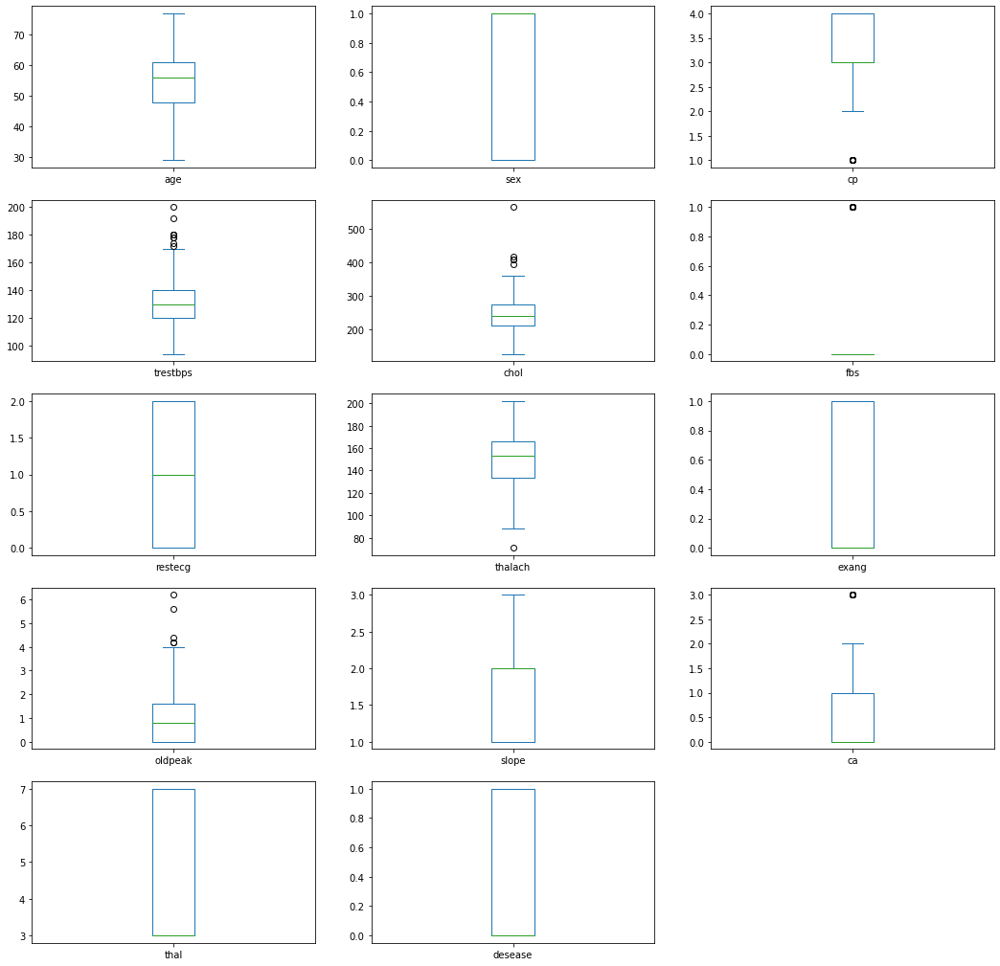

In [72]:
data.plot(kind='box', 
        subplots=True, layout=(5,3), sharex=False, sharey=False, figsize=(18,18))
plt.show()

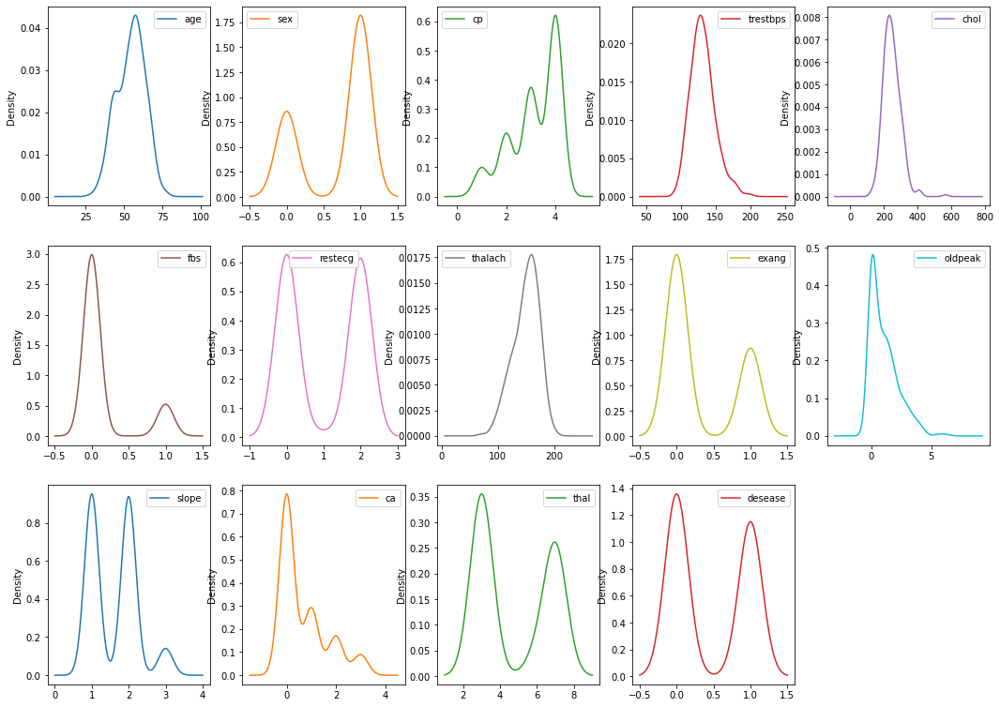

In [73]:
data.plot(kind='density', 
        subplots=True, layout=(4,5), sharex=False, sharey=False, figsize=(18,18))
plt.show()

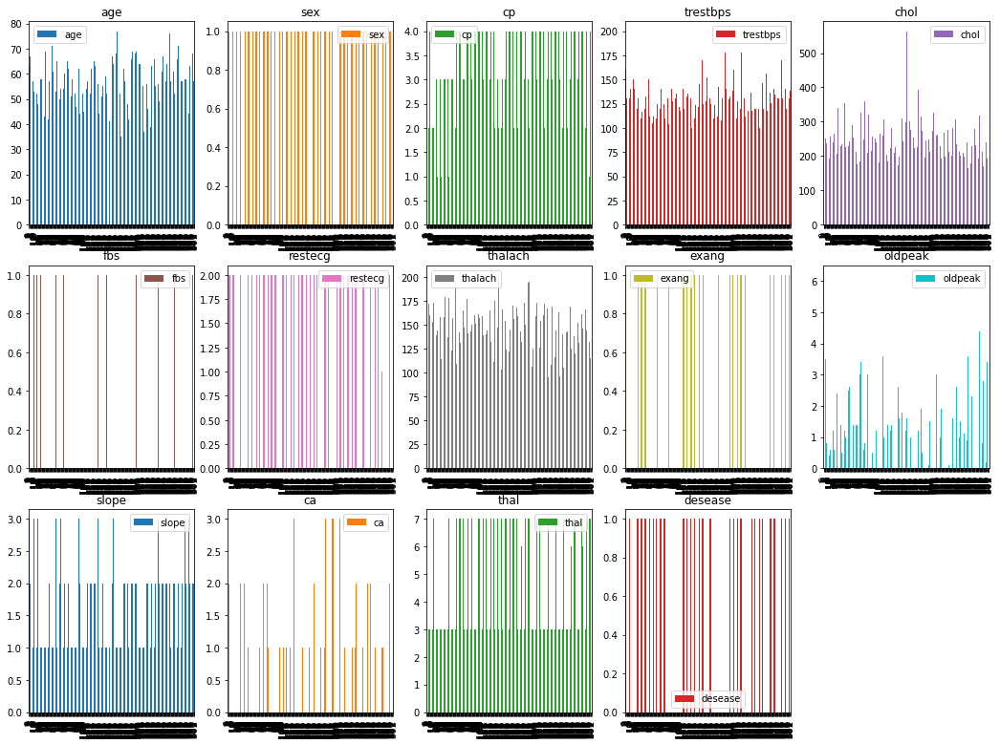

In [74]:
data.plot(kind='bar', 
        subplots=True, layout=(4,5), sharex=False, sharey=False, figsize=(18,18))
plt.show()

In [75]:
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease
0,63,1,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0
1,67,1,4,160,286,0,2,108,1,1.5,2,3.0,3.0,1
2,67,1,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1
3,37,1,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0
4,41,0,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0


In [76]:
import plotly.graph_objects as go
a=data[["age","chol","desease","sex","cp","trestbps"]]
a=a/a.max()
categories = a.columns.tolist()

fig = go.Figure()
for i in [0,100]:
    fig.add_trace(go.Scatterpolar(
          r=a[i:i+1].values.tolist()[0],
          theta=categories,
          fill='toself',
          name='people'+' n° '+str(i)))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True
    )),
  showlegend=True
)

fig.show()

### Test d'adequation aux lois shapiro vs kolmogoriv

In [77]:
#HO: LA VARIABLE SUIT LA LOI NORMALE
#CONCLUSION: si pvalue<0.05 alors notre variable n'est pas normale
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.shapiro.html

In [78]:
scipy.stats.shapiro(data["age"])  #test de shapiro qui permet de savoir si l'age suit la loi normale
#Les personnes ont étés interogées suivant leur age!!!!

ShapiroResult(statistic=0.9864636063575745, pvalue=0.0060694096609950066)

In [79]:

scipy.stats.shapiro(data["age"])  #test de shapiro qui permet de savoir si prix suit la loi normale

ShapiroResult(statistic=0.9864636063575745, pvalue=0.0060694096609950066)

In [80]:
#hypothese: H0: la variable suit la loi normale
#le pvalue est l erreur que je commets en disant que la variable ne suit pas la loi normale
#shapiro permet de savoir si ma donnee suit la loi normale!

#plus simple: si pvalue<5% (seuil de moralité) alors on ne suit pas la loi normale

#conclusion: les ages ne suit pas la loi normale avec le test de shapiro

In [81]:
scipy.stats.kstest(data["age"],"norm") #test de kolmogorov
#L'hypothèse nulle est que la variable suit la loi normale
#conclusion: les prix ne suit pas la loi normale avec le test de kolmogorov (pvalue<5%)

KstestResult(statistic=1.0, pvalue=0.0)

In [82]:
scipy.stats.kstest(data["age"],"expon") #test de kolmogorov
#L'hypothèse nulle est que la variable suit la loi exponentielle
#conclusion: les prix ne suit pas la loi normale avec le test de kolmogorov (pvalue<5%)

KstestResult(statistic=0.9999999999997456, pvalue=0.0)

#conclusion: Subjectivement on pensait que les prix suivaient la loi exponentielle 
#mais le test statistqiue (plus objectif) nous permet d'AFFIRMER que la consommation ne suit ni la loi normale n  la loi exponetielle

### Intervalle de confiance

In [83]:
data["age"].mean()

54.43894389438944

In [84]:
data["age"].sem()  #standart error of mean ou bien erreur type

0.519257589944059

In [85]:
#calculons l'intervalle de confiance de la moyenne (en utilisant la loi normale)

In [86]:

scipy.stats.norm.interval(alpha=0.95,loc=data["age"].mean(),scale=data["age"].sem())    #ok

(53.42121771940002, 55.45667006937886)

In [87]:
#conclusion: la moyenne des conso totale en France est 6000
#par contre si on prends un echantillon, la moyenne sera comprise entre 5400 et 6500 à 95%.

### Analyse bivariée 1 quantitative vs 1 quantitative

#### Visualisation

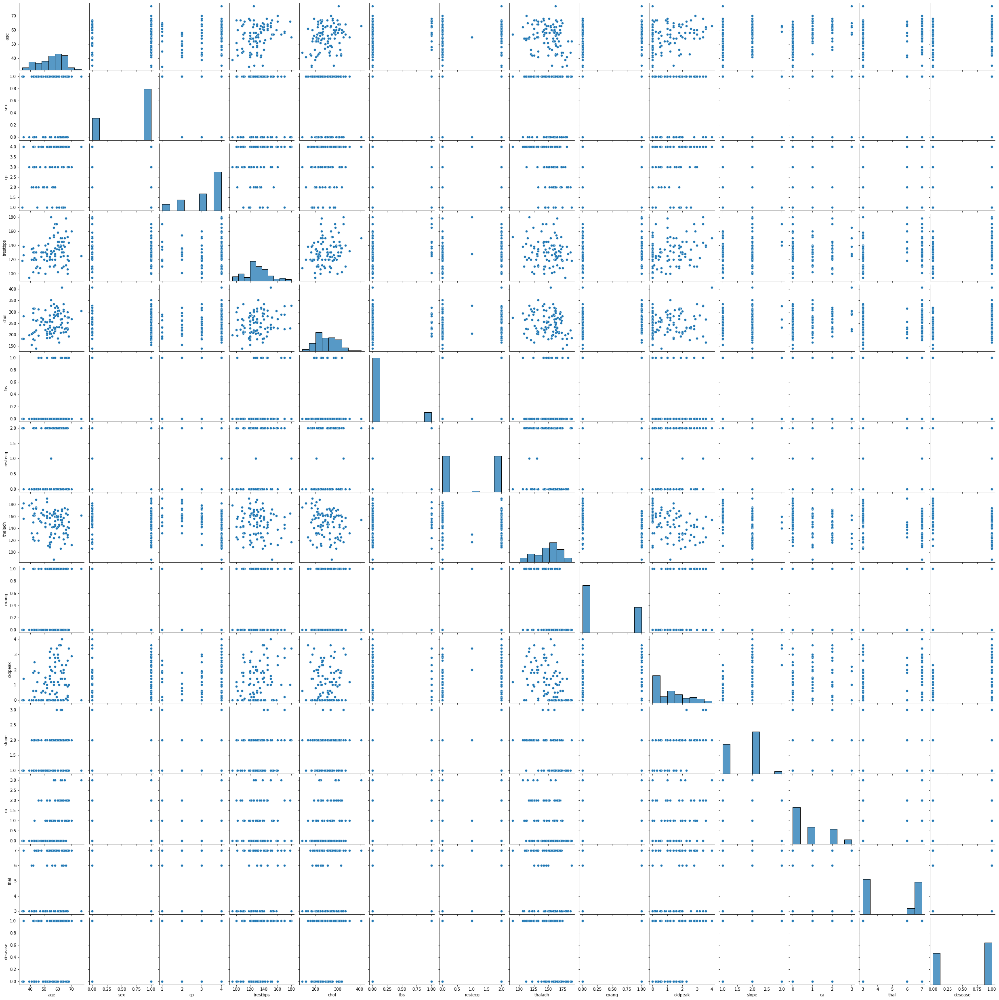

In [88]:
sns.pairplot(data.sample(100))   #data.sample(100) je prends un echantillon 100


In [89]:
data[["age","chol"]].corr()  #le taux de cholesterol augement en focntion de l age

,age,chol
age,1.00000,0.20895
chol,0.20895,1.00000


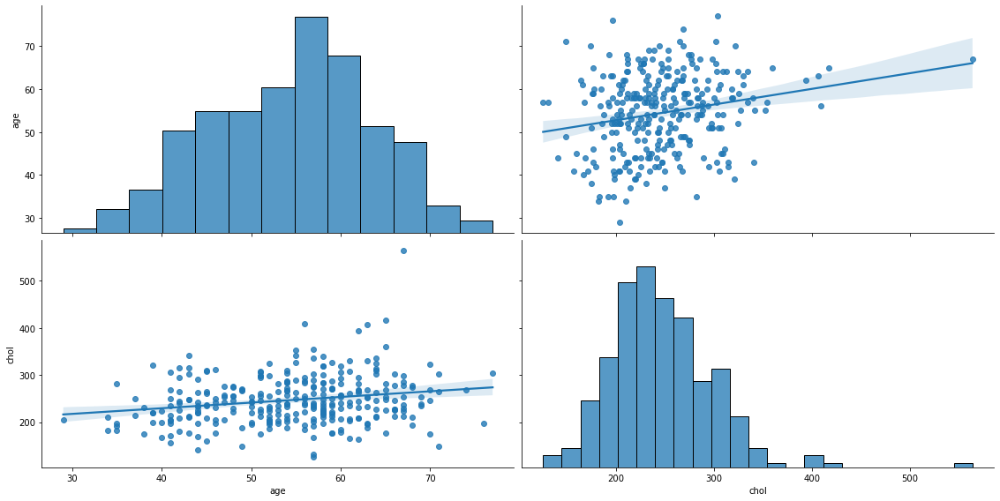

In [90]:

sns.pairplot(data[["age","chol"]], kind="reg",height=4, aspect=2)

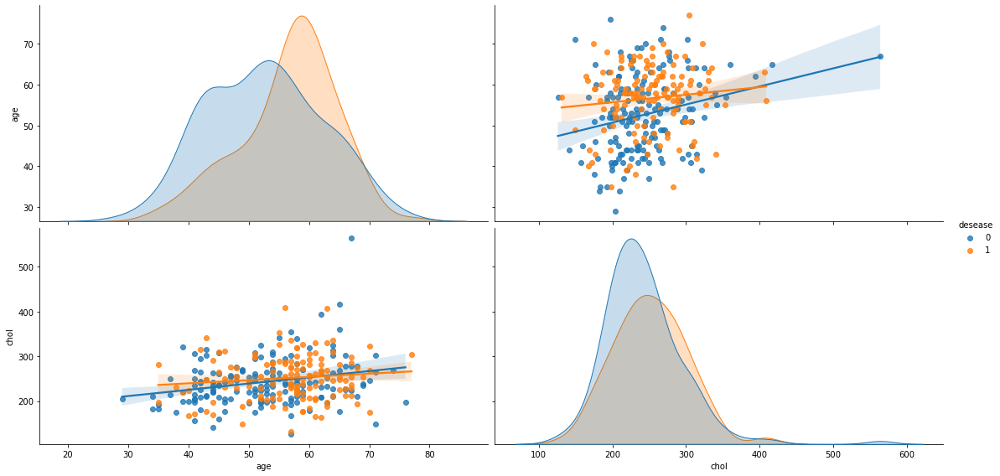

In [91]:


sns.pairplot(data[["age","chol","desease"]], kind="reg", hue="desease",height=4, aspect=2)

#### Matrix correlation

In [92]:
data.corr()["desease"].sort_values(ascending=False)  #detecte les correlation LINEAIRE

desease     1.000000
thal        0.525689
ca          0.460442
exang       0.431894
oldpeak     0.424510
cp          0.414446
slope       0.339213
sex         0.276816
age         0.223120
restecg     0.169202
trestbps    0.150825
chol        0.085164
fbs         0.025264
thalach    -0.417167
Name: desease, dtype: float64

In [93]:
data.corr()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease
age,1.000000,-0.097542,0.104139,0.284946,0.208950,0.118530,0.148868,-0.393806,0.091661,0.203805,0.161770,0.362605,0.127389,0.223120
sex,-0.097542,1.000000,0.010084,-0.064456,-0.199915,0.047862,0.021647,-0.048663,0.146201,0.102173,0.037533,0.093185,0.380936,0.276816
cp,0.104139,0.010084,1.000000,-0.036077,0.072319,-0.039975,0.067505,-0.334422,0.384060,0.202277,0.152050,0.233214,0.265246,0.414446
trestbps,0.284946,-0.064456,-0.036077,1.000000,0.130120,0.175340,0.146560,-0.045351,0.064762,0.189171,0.117382,0.098773,0.133554,0.150825
chol,0.208950,-0.199915,0.072319,0.130120,1.000000,0.009841,0.171043,-0.003432,0.061310,0.046564,-0.004062,0.119000,0.014214,0.085164
fbs,0.118530,0.047862,-0.039975,0.175340,0.009841,1.000000,0.069564,-0.007854,0.025665,0.005747,0.059894,0.145478,0.071358,0.025264
restecg,0.148868,0.021647,0.067505,0.146560,0.171043,0.069564,1.000000,-0.083389,0.084867,0.114133,0.133946,0.128343,0.024531,0.169202
thalach,-0.393806,-0.048663,-0.334422,-0.045351,-0.003432,-0.007854,-0.083389,1.000000,-0.378103,-0.343085,-0.385601,-0.264246,-0.279631,-0.417167
exang,0.091661,0.146201,0.384060,0.064762,0.061310,0.025665,0.084867,-0.378103,1.000000,0.288223,0.257748,0.145570,0.329680,0.431894
oldpeak,0.203805,0.102173,0.202277,0.189171,0.046564,0.005747,0.114133,-0.343085,0.288223,1.000000,0.577537,0.295832,0.341004,0.424510


<AxesSubplot:>

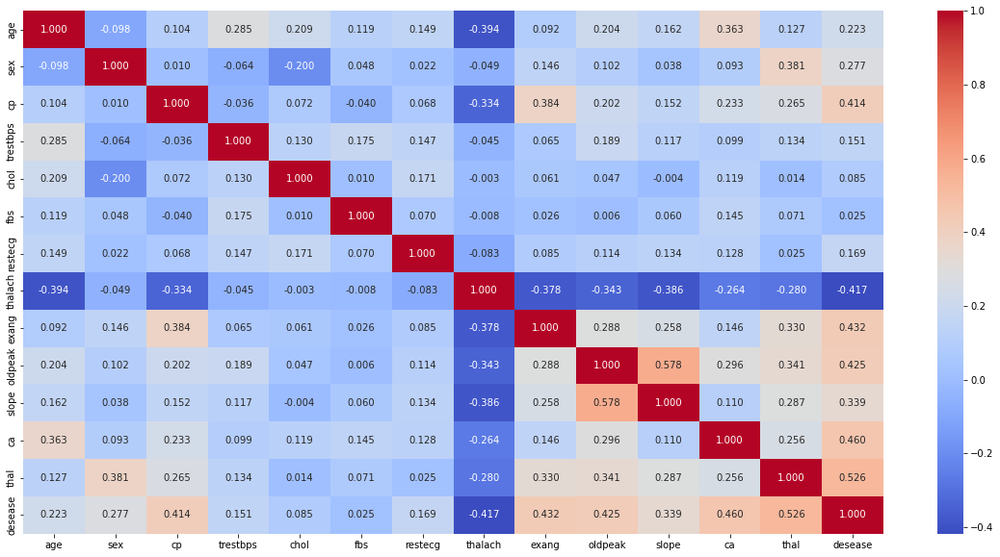

In [94]:
f, ax = plt.subplots(figsize=(20, 10))    #1 correspond à 2.54cm

sns.heatmap(data.corr(),annot=True,fmt="1.3f",cmap='coolwarm')

On voit que les deux variables les plus correlées (lineairement) dans ce dataset sont oldpeak et ca.
Cela veut dire que la connaissance de la dépression ST induite par l'exercice par rapport au repos est tres importante pour pouvoir predire le nombre de gros vaisseaux (0-3) colorés par fluoroscopie

#### Facteur d'inflation de la variance

https://larmarange.github.io/analyse-R/multicolinearite.html

Le facteur d'inflation de la variance est une mesure de l'augmentation de la variance des estimations des paramètres si une variable supplémentaire, donnée par exog_idx, est ajoutée à la régression linéaire. C'est une mesure de la multicolinéarité de la matrice de conception, exog.

Une recommandation est que si VIF est supérieur à 5, alors la variable explicative donnée par exog_idx est fortement colinéaire avec les autres variables explicatives, et les estimations des paramètres auront de grandes erreurs standard à cause de cela.

In [98]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(data.dropna().values, i) for i in range(data.shape[1])]
vif["features"] = data.columns
vif.sort_values(by="VIF Factor")

,VIF Factor,features
5,1.259747,fbs
8,2.086557,exang
6,2.188922,restecg
11,2.285916,ca
9,3.191434,oldpeak
1,3.923610,sex
13,3.964384,desease
12,11.425012,thal
10,11.765073,slope
2,14.027296,cp


Comme nous pouvons le voir, 7 variables ont des valeurs très élevées de VIF, indiquant que ces variables sont corrélées. Certains influent sur d'autres. Par conséquent, considérer ces caractéristiques ensemble conduit à un modèle à forte multicolinéarité.

Les économètres ont développé un certain nombre de règles empiriques pour décider quand s'inquiéter de la colinéarité
Quelle est la taille d'un VIF source de préoccupation ? Comme pour les seuils de signification pour les tests d'hypothèse standard, l'expérience avec certains types de données peut suggérer des tolérances utiles

#### Clustermap


<Figure size 1296x1296 with 0 Axes>

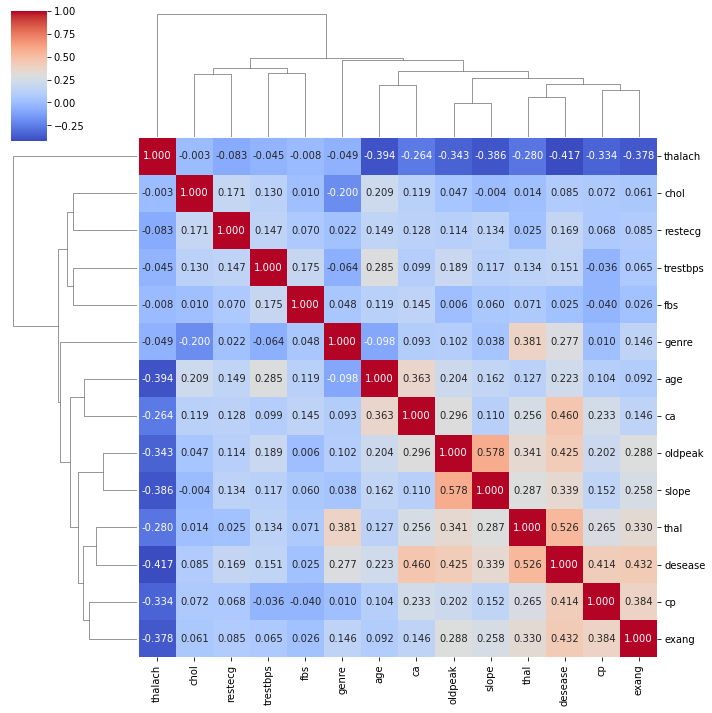

In [112]:
def clustermap(df):
    df_num=df.select_dtypes(exclude=['object'])
    plt.figure(figsize=(18, 18))
    sns.clustermap(df_num.corr(),annot=True,fmt="1.3f",cmap='coolwarm')
    return None
clustermap(data)

In [113]:
data[["age","chol"]].corr()

,age,chol
age,1.00000,0.20895
chol,0.20895,1.00000


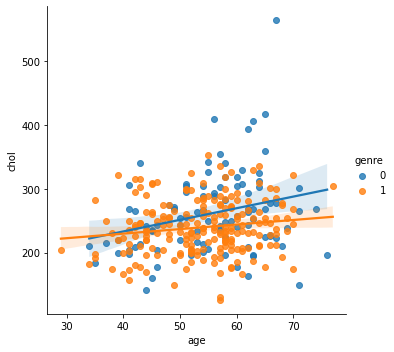

In [116]:

sns.lmplot(x="age", y="chol",hue="genre",order=1,data=data)  #pour mettre une courbe de tendance: lm linear model

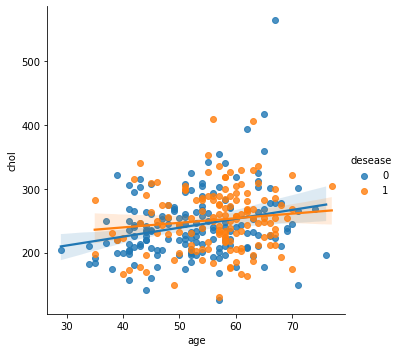

In [124]:
sns.lmplot(x="age", y="chol",hue="desease",order=1,data=data)  #pour mettre une courbe de tendance: lm linear model

In [117]:
#pip install folium

Note: you may need to restart the kernel to use updated packages.


In [125]:
import folium


m = folium.Map(location=[45.5236, -122.6750])
m

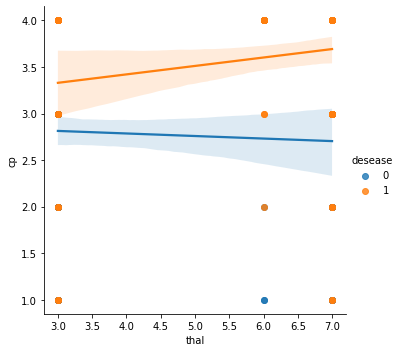

In [115]:
sns.lmplot(x="thal", y="cp",order=1,hue="desease",data=data)  #pour mettre une courbe de tendance: lm linear model

#### Test d'independance de Pearson et spearman


In [ ]:
#HO: x et y sont independants

In [126]:
#faisons un test statistique pour prendre une decision sur la dependance
scipy.stats.pearsonr(data["cp"], data["desease"])

(0.41444638790514265, 5.2507349566752686e-14)

In [ ]:
#pvalue<5% on rejette l'hypothese selon laquelle y'a indepednance


In [ ]:
#conclusion: il y a DEPENDANCE DE TYPE LINEAIRE entre les deux variables

In [127]:
#Quantification de la dependance
data[["cp","desease"]].corr(method="pearson")

,cp,desease
cp,1.000000,0.414446
desease,0.414446,1.000000


In [ ]:
#conclusion: nos variables sont dependants à 96% (lineaire)

In [128]:
#faisons un test statistique pour prendre une decision sur la dependance: objectif    FAIT TOUJOURS UN TESTTTTTTT
scipy.stats.spearmanr(data["cp"], data["desease"])
#coefficient de relation monotone qui verifie l evolution de x et y dans le meme sens (dans le cas general on parlera d'une relation non lineaire)


SpearmanrResult(correlation=0.4720063588486247, pvalue=3.2322831604016932e-18)

age genre cp trestbps chol fbs restecg thalach exang oldpeak slope ca thal desease


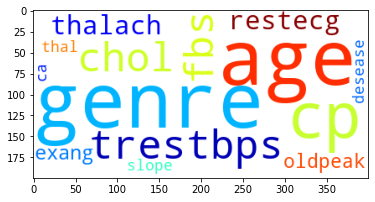

In [129]:
#BONUS
#pip install WordCloud
from wordcloud import WordCloud
def word_cloud(df):
    all_words = ' '.join([text for text in df])
    print(all_words)
    wordcloud = WordCloud(
        background_color='white',
        colormap='jet').generate(all_words)
    plt.imshow(wordcloud);
word_cloud(data)

### Analyse bivariée 1 quantitative vs 1 qualitative

#### Visualisation box-violon-boxenplot

<AxesSubplot:ylabel='age'>

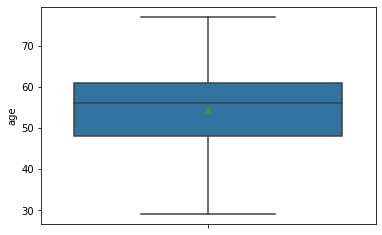

In [131]:
sns.boxplot(y='age',showmeans=True,showfliers=False,data=data)

<AxesSubplot:xlabel='desease', ylabel='age'>

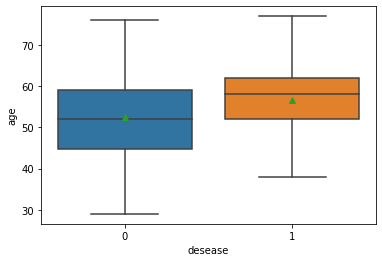

In [130]:

sns.boxplot(y='age',x="desease",showmeans=True,showfliers=False,data=data)

In [ ]:
#A cette etape, on ne peut pas affirmer qu'il y a une dependance entre price et cut, il faudra analyser et faire des tests!

In [134]:
data.groupby("desease").mean().age

desease
0    52.585366
1    56.625899
Name: age, dtype: float64

<AxesSubplot:xlabel='desease', ylabel='cp'>

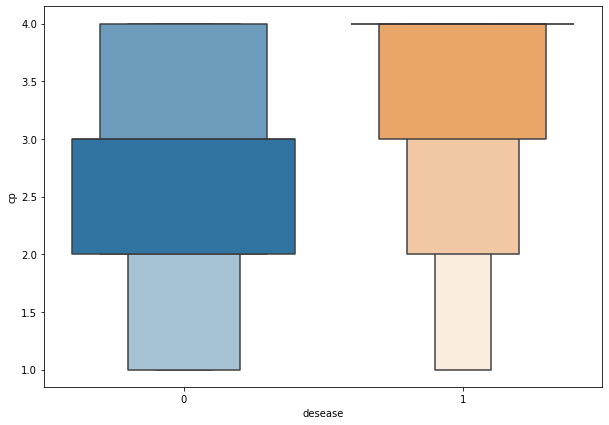

In [135]:
fig, ax = plt.subplots(figsize=(10,7))

sns.boxenplot(x="desease", y="cp",
              scale="linear", data=data)

<AxesSubplot:xlabel='desease', ylabel='cp'>

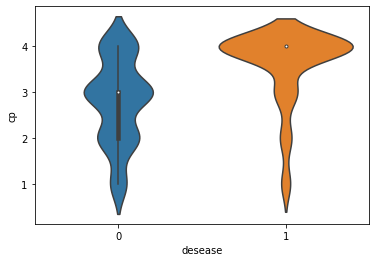

In [136]:

sns.violinplot(x="desease", y="cp",data=data)

In [ ]:
sns.boxplot(y='cp',x="desease",showmeans=True,showfliers=False,data=data)

#### Test parametrique d'ANOVA

In [138]:
#H0: "la maladie ne depend pas de l age"
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('chol ~desease', data=data).fit()
print(model.summary())
anova_table = sm.stats.anova_lm(model)
anova_table
#si p-value(PR(>F))<0.05 (seuil de moralite) alors la maladie depend de l age

                            OLS Regression Results                            
Dep. Variable:                   chol   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     2.199
Date:                Fri, 14 Oct 2022   Prob (F-statistic):              0.139
Time:                        14:28:36   Log-Likelihood:                -1624.3
No. Observations:                 303   AIC:                             3253.
Df Residuals:                     301   BIC:                             3260.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    242.6402      4.035     60.132      0.0

,df,sum_sq,mean_sq,F,PR(>F)
desease,1.0,5872.019185,5872.019185,2.199054,0.139142
Residual,301.0,803744.436261,2670.247297,NaN,NaN


#### Test non paramtrique de Kruskal Wallis

In [139]:
#bonus: resultats differents: prenez Krsukal qui est beaucoup plus precis et non parametriques
from scipy.stats import f_oneway, kruskal
label=list(data.desease.unique())
data_a = [data[data["desease"] == a].age for a in label]

# Anova Test
stat1, p1 = f_oneway(*data_a)
print('---ANOVA---')
print('stat={:.3f}, pvalue={}'.format(stat1, p1))
print('Proba. same distr') if p1 > 0.05 else print('Prob. different distr')
print("")
stat2, p2 = kruskal(*data_a)
print('---Kruskal-Wallis---')
print('stat={:.3f}, pvalue={}'.format(stat2, p2))
print('Prob. same distr') if p2 > 0.05 else print('Prob. different distr')

---ANOVA---
stat=15.770, pvalue=8.955636917529639e-05
Prob. different distr

---Kruskal-Wallis---
stat=16.916, pvalue=3.90611316971462e-05
Prob. different distr


### Analyse bivariée 1 qualitative vs 1 qualitative

#### Visualisation

In [ ]:
data.head()

<AxesSubplot:ylabel='desease'>

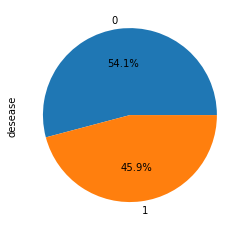

In [140]:

data.desease.value_counts().plot(kind='pie', autopct='%1.1f%%')

#### Tableaux de contingence

In [ ]:
#il faut d abord regrouper les donnees dans un tableau de contingence ou tableau croisé dynamique

In [142]:
t=pd.crosstab(data.genre, data.desease)
t

desease,0,1
genre,,
0,72,25
1,92,114


In [160]:
25/97

0.25773195876288657

In [144]:
114/(114+92)

0.5533980582524272

<AxesSubplot:xlabel='genre'>

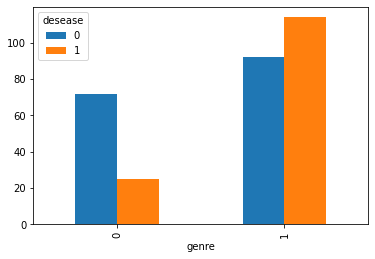

In [145]:
t.plot.bar()

In [150]:
tab=pd.crosstab(data.genre, data.desease,normalize = "columns")*100
tab

desease,0,1
genre,,
0,43.902439,17.985612
1,56.097561,82.014388


In [155]:
data.genre.value_counts().tolist()

[206, 97]

#### Nested Pie charts

In [163]:
data.desease.value_counts(normalize=True).tolist()

[0.5412541254125413, 0.45874587458745875]

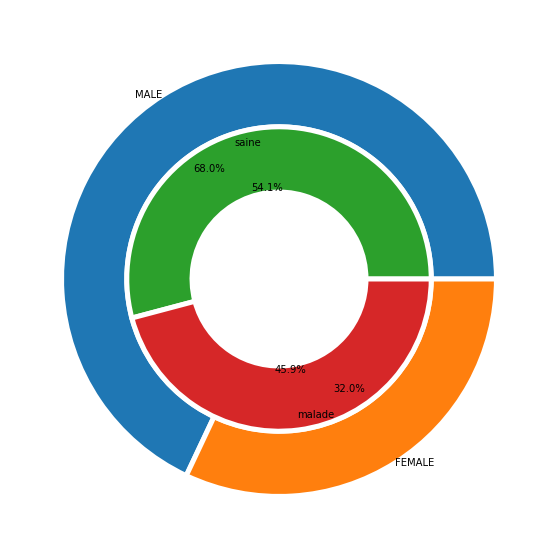

In [159]:
fig, ax = plt.subplots(figsize=(20,10))

v1 = data.genre.value_counts().tolist()
labels1 = ["MALE", "FEMALE"]

v2 = data.desease.value_counts().tolist()
labels2 = ["saine", "malade"]

width = 0.3
wedge_properties = {"width":width, "edgecolor":"w",'linewidth': 5}

plt.pie(v1, labels=labels1, labeldistance=1,autopct='%1.1f%%',wedgeprops=wedge_properties)
plt.pie(v2, labels=labels2, labeldistance=0.9,autopct='%1.1f%%', radius=1-width, wedgeprops=wedge_properties)

plt.show()

In [164]:
import plotly
import plotly.graph_objs as go

df = [# (inner )
go.Pie(values=v2,labels=['saine','malade'],domain={'x':[0.2,0.8], 'y':[0.1,0.9]},hole=0.3),
# (outer)
go.Pie(values=v1,labels=["MALE", "FEMALE"],domain={'x':[0.1,0.9], 'y':[0,1]},hole=0.7,showlegend=True)]

fig = go.Figure(data=df, layout={'title':'Nested Pie Chart'})

plotly.offline.iplot(fig)

#### Test du KHI2

In [165]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   genre     303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        299 non-null    float64
 12  thal      301 non-null    float64
 13  desease   303 non-null    int64  
dtypes: float64(3), int64(11)
memory usage: 33.3 KB


In [172]:
x=pd.DataFrame(["male","female","male"], columns=["genre"])
x

,genre
0,male
1,female
2,male


In [174]:
pd.get_dummies(data, columns=["genre"])

,age,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,desease,genre_0,genre_1
0,63,1,145,233,1,2,150,0,2.3,3,0.0,6.0,0,0,1
1,67,4,160,286,0,2,108,1,1.5,2,3.0,3.0,1,0,1
2,67,4,120,229,0,2,129,1,2.6,2,2.0,7.0,1,0,1
3,37,3,130,250,0,0,187,0,3.5,3,0.0,3.0,0,0,1
4,41,2,130,204,0,2,172,0,1.4,1,0.0,3.0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,45,1,110,264,0,0,132,0,1.2,2,0.0,7.0,1,0,1
299,68,4,144,193,1,0,141,0,3.4,2,2.0,7.0,1,0,1
300,57,4,130,131,0,0,115,1,1.2,2,1.0,7.0,1,0,1
301,57,2,130,236,0,2,174,0,0.0,2,1.0,3.0,1,1,0


In [177]:
pd.get_dummies(x)

,genre_female,genre_male
0,0,1
1,1,0
2,0,1


In [175]:

#https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.chi2_contingency.html
chi2, p, dof, exepted = scipy.stats.chi2_contingency(t)
p
#vous pouvez aussi essayer la fonction https://www.statsmodels.org/0.8.0/contingency_tables.html

2.666712348180942e-06

In [176]:
exepted #le tableau que l'on devrait avoir si y'avait une independance totale

array([[ 52.50165017,  44.49834983],
       [111.49834983,  94.50165017]])

In [178]:
t

desease,0,1
genre,,
0,72,25
1,92,114


In [179]:
t.values-exepted #aucune difference n'est constatée; cela confirme l'hypotese d'indepednance

array([[ 19.49834983, -19.49834983],
       [-19.49834983,  19.49834983]])

In [ ]:
#fin pour les 3 jours de seminaire avec les dm1

In [180]:
pip install fitter

Note: you may need to restart the kernel to use updated packages.
  Created wheel for fitter: filename=fitter-1.5.1-py3-none-any.whl size=25608 sha256=1eb58350aee91c2961868f2ebdd06e665e859b248dbc5edef3eb6785388cdd48
  Stored in directory: c:\users\sambe\appdata\local\pip\cache\wheels\e2\61\91\27138abaab263acc3874ef03fe29140fb0d42d5cb1406ef635
Successfully built fitter


<AxesSubplot:ylabel='Density'>

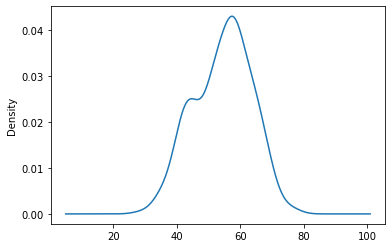

In [3]:
data.age.plot(kind="density")

Fitting 11 distributions: 100%|████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 18.10it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
f,0.000116,1603.256360,-4452.978020,inf,0.031846,0.908578
chi2,0.000118,1647.449732,-4454.279107,inf,0.035306,0.831271
gamma,0.000118,1647.449528,-4454.279090,inf,0.035306,0.831272
t,0.000139,1633.733292,-4404.544809,inf,0.038316,0.750313
norm,0.000147,1936.787614,-4393.073468,inf,0.055353,0.300043


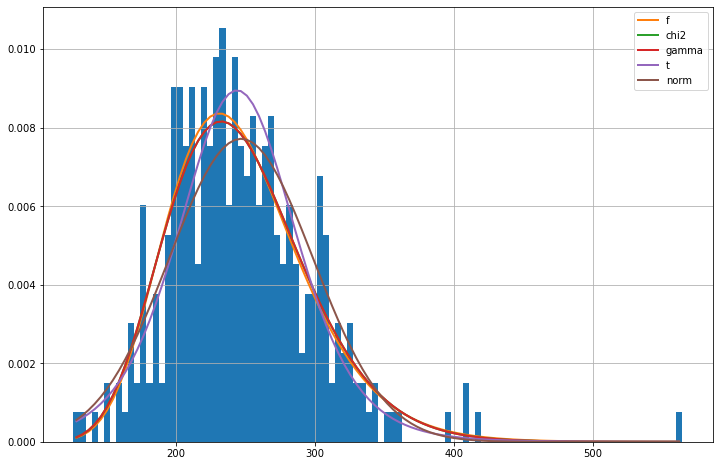

In [8]:
from fitter import Fitter, get_common_distributions, get_distributions
distribution_M2=["norm","chi2","cauchy","expon","f","t",'gamma',"beta","pareto","uniform","dweibull"]

f = Fitter(data["chol"].values,
           distributions=distribution_M2)
f.fit()
plt.figure(figsize=(12, 8))

f.summary()

### Analyse multivariée de variance (MANOVA) à un facteur: Multivariate ANOVA

L’analyse de variance multivariée ou MANOVA est une méthode visant à déterminer les effets significatifs de variables qualitatives considérées en interaction ou pas sur un ensemble de variables quantitatives dépendantes.

In [ ]:
data.head()

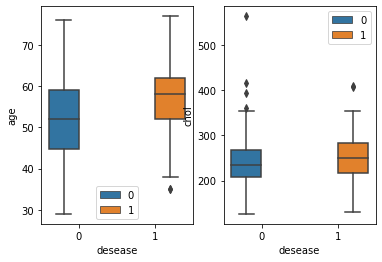

In [183]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, axs = plt.subplots(ncols=2)
sns.boxplot(data=data, x="desease", y="age", hue=data.desease.tolist(), ax=axs[0])
sns.boxplot(data=data, x="desease", y="chol", hue=data.desease.tolist(), ax=axs[1])
plt.show()

<AxesSubplot:xlabel='desease'>

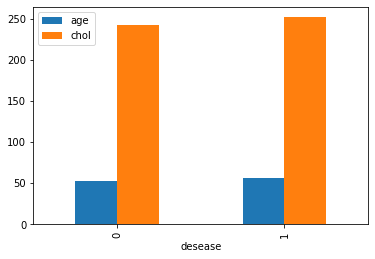

In [184]:
data[["age","chol","desease"]].groupby('desease').mean().plot(kind="bar")

In [185]:
from statsmodels.multivariate.manova import MANOVA
fit = MANOVA.from_formula('age + chol ~ desease', data=data)
print(fit.mv_test())

                   Multivariate linear model
                                                                
----------------------------------------------------------------
       Intercept         Value  Num DF  Den DF   F Value  Pr > F
----------------------------------------------------------------
          Wilks' lambda  0.0365 2.0000 300.0000 3960.5873 0.0000
         Pillai's trace  0.9635 2.0000 300.0000 3960.5873 0.0000
 Hotelling-Lawley trace 26.4039 2.0000 300.0000 3960.5873 0.0000
    Roy's greatest root 26.4039 2.0000 300.0000 3960.5873 0.0000
----------------------------------------------------------------
                                                                
----------------------------------------------------------------
           desease         Value  Num DF  Den DF  F Value Pr > F
----------------------------------------------------------------
             Wilks' lambda 0.9487 2.0000 300.0000  8.1171 0.0004
            Pillai's trace 0.0513 2.0000 300.

Les statistiques du test Pillai's Trace sont statistiquement significatives [p < 0,00001]
p est bien plus faible que le seuil de risque alpha (0.05). Nous pouvons donc rejeter l’hypothèse nulle de l’absence d’effet.

Les resultats indiquent que les degrés de maladie ont une association statistiquement significative avec l'age combinée de la personne et le taux de cholesterol.

In [110]:
data.columns

Index(['age', 'genre', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'desease'],
      dtype='object')

In [111]:
#bonus peut on predire l'age
import statsmodels.api as sm
from statsmodels.formula.api import ols
model = ols('age ~cp+trestbps+chol+fbs+restecg+thalach+exang+oldpeak+slope+ca+thal', data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    age   R-squared:                       0.324
Model:                            OLS   Adj. R-squared:                  0.298
Method:                 Least Squares   F-statistic:                     12.41
Date:                Fri, 14 Oct 2022   Prob (F-statistic):           4.19e-19
Time:                        12:06:17   Log-Likelihood:                -1017.0
No. Observations:                 297   AIC:                             2058.
Df Residuals:                     285   BIC:                             2102.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     55.3244      5.952      9.295      0.0

### ANCOVA ou analyse de covariance

En utilisant l'analyse de covariance (ANCOVA), notre but est d'étudier comment le cholesterol varie en fonction du sexe (variable qualitative prenant la valeur f ou m), de oldpeak et de l'âge, et de vérifier si une relation linéaire a un sens.

L'ANCOVA est une méthode proche de la régression linéaire ou de l'ANOVA, faisant aussi partie de la famille GLM (Generalized linear models). Sa spécificité est de mélanger des variables quantitatives et qualitatives.


In [ ]:
#pip install pingouin --user

In [ ]:
plt.figure(figsize = (20,10))


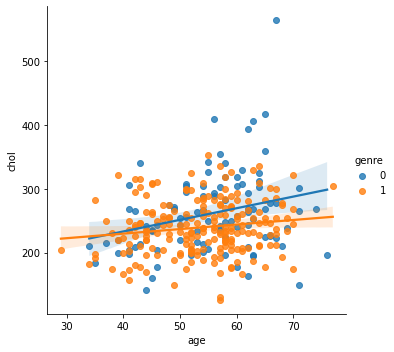

In [186]:
sns.lmplot(x="age", y="chol",order=1,hue="genre",data=data)  #pour mettre une courbe de tendance: lm linear model

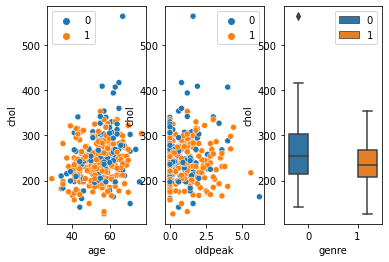

In [189]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, axs = plt.subplots(ncols=3)
sns.scatterplot(data=data, x="age", y="chol", hue=data.genre.tolist(), ax=axs[0])
sns.scatterplot(data=data, x="oldpeak", y="chol", hue=data.genre.tolist(), ax=axs[1])
sns.boxplot(data=data, x="genre", y="chol", hue=data.genre.tolist(), ax=axs[2])
plt.show()

In [191]:
from pingouin import ancova, read_dataset
ancova(data=data, dv='chol', covar=['age', 'oldpeak'], between='genre')

,Source,SS,DF,F,p-unc,np2
0,genre,26917.663731,1,10.769408,0.001154,0.034766
1,age,26250.439826,1,10.502461,0.001327,0.033933
2,oldpeak,584.669511,1,0.233919,0.628987,0.000782
3,Residual,747337.390733,299,NaN,NaN,NaN


Le tableau suivant fournit les détails sur le modèle et est essentiel dès lors que le modèle doit être utilisé pour faire des prévisions, des simulations ou s'il doit être comparé à d'autres résultats. Nous voyons que la p-value associé au test pour le sexe est de 0.03. Cela confirme l'impact du sexe sur le modèle. Si l'on s'en tient à la valeur du paramètre associé au sexe féminin, il semblerait que pour la valeur de oldpeak et un âge donnés, le fait d'être une fille ait un impact sur le cholesterol.

En conclusion, le taux de oldpeak, l'âge et le sexe permettent d'expliquer 7.7% de la variabilité du cholesterol. Une part importante de la variabilité du cholesterol reste donc inexpliquée par ce modèle d'ANCOVA.

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
model = ols('chol ~age+oldpeak+sex', data=data).fit()
print(model.summary())
anova_table = sm.stats.anova_lm(model)
anova_table
#si p-value(PR(>F))<0.05 (seuil de moralite) alors la maladie depend de l age

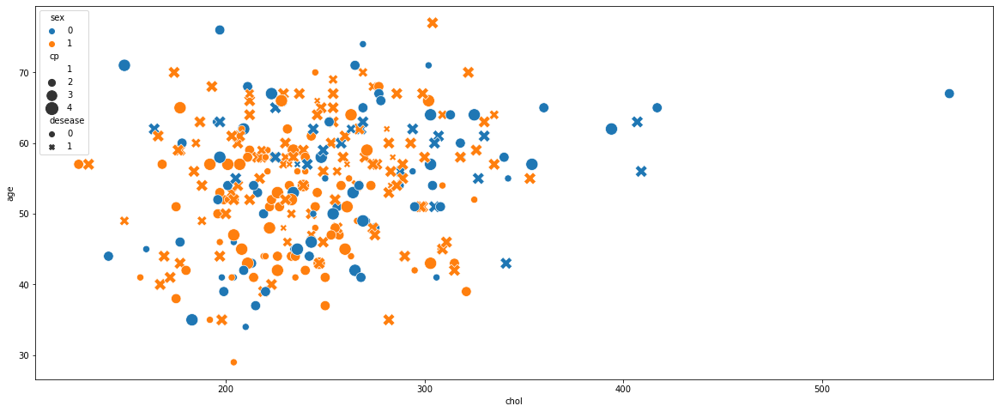

In [106]:
plt.figure(figsize = (20,8))

# use the scatterplot function to build the bubble map
sns.scatterplot(data=data, x="chol", y="age", size="cp", hue="sex",style="desease",legend=True, sizes=(0, 200))

# show the graph
plt.show()

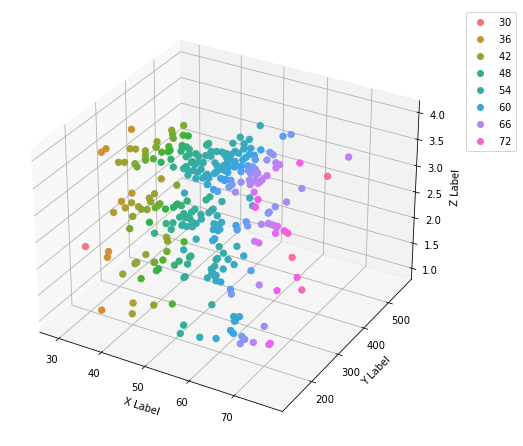

In [109]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

x = data.age
y = data.chol
z = data.cp

# axes instance
fig = plt.figure(figsize=(6,6))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)

# get colormap from seaborn
cmap = ListedColormap(sns.color_palette("husl", 256).as_hex())

# plot
sc = ax.scatter(x, y, z, s=40, c=x, marker='o', cmap=cmap, alpha=1)
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

# legend
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)

# save
plt.savefig("scatter_hue", bbox_inches='tight')

## Nettoyage la base de donnees

Les outils de dataprep proposent ensuite des fonctionnalités pour nettoyer les données (data cleansing). Le nettoyage des données est indispensable pour disposer de data sets fiables, valides et exploitables.

### Traitement des valeurs impossibles


### Traitement des données duppliquées


In [ ]:
data.duplicated().sum()  #aucune ligne n'est dupliquée à 100%

In [ ]:
data[data.duplicated()]

In [ ]:
#s'il y avait des donnees dupliquées, on utiliserait la commande https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop_duplicates.html
#pour supprimer les dupliquées

data=data.drop_duplicates(keep='first')
data.head()

In [ ]:
data[data.duplicated(subset=["sex", "age","cp","desease"])]


### Traitement des valeurs impossibles


In [ ]:
data.describe()

### Traitement des données aberrantes


In [ ]:
#questions: pourquoi ces données extremes?
#Comment les traiter: deux possiblités (#1: les supprimer definitivement: dangereux
                                        #2: les imputer par une valeur maximale que vous aurez choisie: subjective
                                        #3: les enlever du dataset et les traiter separement: realité & conseillé)
#par contraire pour trouver les vraies donnees extemes ou outliers il faut faire une analyse MULTIVARIEE

#la methode de Tukeys qu'on avait utilisé repose sur une analyse UNIVARIEE(on regarde les variables 1 par 1)


#le traitement des outliers depend de la precision de votre modele IA

#https://scikit-learn.org/stable/auto_examples/miscellaneous/plot_anomaly_comparison.html#sphx-glr-auto-examples-miscellaneous-plot-anomaly-comparison-py

#détection d'anomalies pour la détection des valeurs aberrantes sur les jeux de données


### Traitement des données manquantes

In [ ]:
#justification: aucun modele statistqiue, machine et deep learning ne prend en compte les donnees manquantes

In [ ]:
#decision statistique: cette donnee n'apportera rien à notre modele IA donc il faut le supprimer
#decision professionnelle: essayer de comprendre "le pourquoi" et trouvez une explication aux manques d'information


In [ ]:
#pour les valeurs manquantes au niveau des echanges etc, 
#il faut les remplacer par des moyennes, medianes, mode, valeur_choisie, knn?
#ce dataset est un peu spacial et les donnees manquantes sont juste des valeurs nulle

In [ ]:
# il existe une autre manière rapide de se faire une idée du contenu de la base de données sous forme graphique
colours = ['#00ff00', '#000099'] # ici on choisit comme couleur bleu les données vides et en vert celles qui sont présentes
sns.heatmap(data.isna(), cmap=sns.color_palette(colours))

In [ ]:
data.ca.mode()

In [ ]:
data["thal"].mode()

In [ ]:
data["thal"]=data["thal"].fillna(3)
data["ca"]=data["ca"].fillna(3)

data.isna().sum()

In [ ]:
data.isna().sum()

In [ ]:
def monanalyse(data):
    e=1e-10    
    import scipy

    stat=pd.DataFrame()
    dfnum = data.select_dtypes(exclude='object')
    stat=dfnum.describe().T
    stat["var"]=dfnum.var()
    stat["erreur_type"]=stat["std"]/np.sqrt(dfnum.shape[0])
    stat["skewness"]=dfnum.skew()-0
    stat["kurtosis"]=dfnum.kurtosis()-3
    stat["taux_disp_moyen"]=stat["std"]/(stat["mean"]+e)*100
    stat["taux_disp_median"]=(stat["75%"]-stat["25%"])/(stat["50%"]+e)*100

    stat["outmax"]=stat["75%"]+1.5*(stat["75%"]-stat["25%"])  #Q3+1.5*IQR
    stat["outmin"]=stat["25%"]-1.5*(stat["75%"]-stat["25%"])  #Q1-1.5*IQR
    
    stat["taux_outlier"]=((dfnum>stat["75%"]+1.5*(stat["75%"]-stat["25%"]))
                       | (dfnum<stat["25%"]-1.5*(stat["75%"]-stat["25%"]))).sum()/dfnum.shape[0]*100
    stat["taux_manquant"]=dfnum.isna().sum()/dfnum.shape[0]*100

    stat["unique"]=dfnum.nunique()#/dfnum.shape[0]*100

    return stat

In [ ]:
monanalyse(data)

## Enrechissement de la base de donnees

enrichir le CSV préalablement obtenu avec une nouvelle colonne.

L’enrichissement des données est la troisième fonctionnalité clé des outils de dataprep. Enrichir les données consiste à améliorer le taux de complétude de la base de données (les cellules vides) et/ou à ajouter de nouveaux champs. L’enrichissement des données permet ensuite de mieux segmenter et personnaliser les campagnes/scénarios marketing ou les actions commerciales. Si l’enrichissement des données est si important, c’est que la personnalisation et le ciblage sont des clés de performance en marketing-ventes. Plus vous avez d’informations sur vos clients ou contacts, mieux c’est !

L’enrichissement de données peut s’effectuer de deux manières complémentaires :

A partir de sources de données internes.
A partir de sources de données externes : fournisseurs de données spécialisés, bases de données publiques, LinkedIn…
L’enrichissement des données améliore la valeur et le potentiel d’activation de vos données.

## Table Manipulator

### Column sorting

### Column row filtering

### Concatenation of multiple files/tables

### Column renaming

## Transformation de la base de donnees

### Data blending: Join, concatenate, append

### Aggregation: Grouping, pivoting, binning

### Feature Creation and Selection

## Pretraitement de la base de donnees

## Apprentissage: classification, regression, recommandation, anomaly, clustering, time forcasting

## Prediction

## Dashboard

## Storring telling

## Data journalisme

## Strategie business

## Interprétabilité des modèles

L’explicabilité des algorithmes prend de plus en plus de place dans les débats autour de la Data Science. On sait que les algorithmes sont puissants, on sait qu’ils peuvent nous assister dans de nombreuses tâches : prédiction de prix, classification de documents, recommandation de vidéos.

Dorénavant, on se pose de plus en plus de questions sur cette prédiction :

est-elle éthique ?
est-elle touchée par des biais ?
est-elle prise pour de bonnes raisons ?
Dans de nombreux secteurs comme la médecine, la banque ou encore l’assurance, l’emploi d’algorithmes peut avoir lieu si, et seulement si, il est possible de tracer et expliquer (ou encore mieux interpréter) les décisions de ces dits algorithmes.

Parenthèse sur le vocabulaire
Dans cet article nous souhaitons distinguer les termes :

Explicabilité: possibilité d’expliquer d’un point de vue technique la prédiction d’un algorithme.

Interprétabilité: capacité d’expliquer ou de fournir du sens en termes compréhensibles par un être humain.

Transparence: un modèle est considéré comme transparent s’il est compréhensible en soi.

explications globales

explications concernant fonctionnement du modèle de point de vue général

explication locales

explications du modèle pour un instance

 Aspect légal : L’article 22 du RGPD prévoit des règles pour éviter que l’homme ne
subisse des décisions émanant uniquement de machines. Les modèles sans
explication risquent d’entraîner une sanction qui peut s’élever à 20 000 000 d’euros
ou, dans le cas d’une entreprise, à 4% du chiffre d’affaires mondial total de l’exercice
précédent (le montant le plus élevé étant retenu). »
Interprétabilité du modèle

« Validation du modèle : Le modèle a une bonne précision, mais nous cherchons à
connaître les variables influentes afin de vérifier la cohérence avec la connaissance
métier du domaine. D’autre part, pour certaines applications, nous devons également
contrôler le risque du modèle, ce qui nécessite une compréhension approfondie de
celui-ci. »

« Explication et recommandation : Imaginons le client d’une banque faisant une
demande de prêt, la demande est refusée suite à la décision d’un modèle de ML. Il
faut cependant pouvoir expliquer à ce client les raisons de ce refus afin de pouvoir le
conseiller. »
http://www.aquiladata.fr/insights/shap-mieux-comprendre-linterpretation-de-modeles/

## Audit: Biais et Ethique

Framworks: Documentez vous sur ces deux framworks tres interessants
Aquiestas: https://www.youtube.com/watch?v=wmyVODy_WD8
Shap: https://www.youtube.com/watch?v=VLGWJkWwhVE

## Deploiment et maintenance

 Streamlit: A faster way to build and share data apps
 Flask: https://flask.palletsprojects.com/en/2.1.x/
 Django: https://docs.djangoproject.com/fr/4.0/intro/

Les données, une fois préparées, doivent être exportées dans les outils de destinatation : outils d’activation, outils d’analyse, entrepôt de données, CustomerDataPlatform…
Les capacités d’export des données sont un facteur discriminant dans le choix d’un outil de data preparation.

## Text Processing

## Times Series Analysis

## ETL & CRM  & CLOUD

In [ ]:
1+1